In [1]:
#!/usr/bin/python
#import wradlib as wrl
import pylab as pl
from glob import glob
import warnings
warnings.filterwarnings('ignore')
try:
    get_ipython().magic("matplotlib inline")
except:
    pl.ion()
import numpy as np

import csv
import os
import datetime
import pandas as pd

#shapefile: GIS vector data format (ESRI)
import shapefile as shp  # Requires the pyshp package
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import ticker
import netCDF4 as nc4
from datetime import date,timedelta
import plotly.graph_objs as go
import matplotlib.lines as mlines
import seaborn as sns
import shapely
from geopandas.tools import sjoin

import importlib
import geopandas as gpd
import xarray as xr
import cartopy.crs as ccrs  # Projections list

import _pickle as pickle

#import external functions (need pip install ipynb)
import ipynb.fs.full.HaileventsFunctions as HF

# Notebook to compare filtered and non-filtered OTs  for the full 3-years set


In [2]:
#Folder address containing data:
fold = '/home/ciccuz/phd/KIT/hail_data/'
plt_fold = '/home/ciccuz/phd/KIT/scripts/plots/OT_filt-nonfilt_comparison_fullSet'

In [3]:
# must run the bash command: sshfs -p22 giordano@imk-tss-risk:/hail4/punge/ ./hail4_punge/

#With geopandas: NEW VERSION!
sfg_ita = gpd.read_file(fold + "hail4_punge/geodata/ITA_adm/ITA_adm0.shp", encoding='latin-1')
sfg_deu = gpd.read_file(fold + "hail4_punge/geodata/DEU_adm/DEU_adm0.shp", encoding='latin-1')
sfg_aut = gpd.read_file(fold + "hail4_punge/geodata/AUT_adm/AUT_adm0.shp", encoding='latin-1')
sfg_che = gpd.read_file(fold + "hail4_punge/geodata/CHE_adm/CHE_adm0.shp", encoding='latin-1')
sfg_cro = gpd.read_file(fold + "hail4_punge/geodata/Croatia/mj788hg8036.shp", encoding='latin-1')
sfg_slo = gpd.read_file(fold + "hail4_punge/geodata/Slovenia/gk259nt7452.shp", encoding='latin-1')
sfg_hun = gpd.read_file(fold + "hail4_punge/geodata/Hungary/qh513vs8921.shp", encoding='latin-1')
sfg_alg = gpd.read_file(fold + "hail4_punge/geodata/algeria/rt767cn2098.shp", encoding='latin-1')
sfg_tun = gpd.read_file(fold + "hail4_punge/geodata/tunisia/TUN_adm0.shp", encoding='latin-1')
sfg_bos = gpd.read_file(fold + "hail4_punge/geodata/bosnia/bt512fj0408.shp", encoding='latin-1')
sfg_fra = gpd.read_file(fold + "hail4_punge/geodata/france/dw125xh0996.shp", encoding='latin-1')
sfg_mon = gpd.read_file(fold + "hail4_punge/geodata/montenegro/MNE_adm0.shp", encoding='latin-1')
sfg_cze = gpd.read_file(fold + "hail4_punge/geodata/czech/CZE_adm0.shp", encoding='latin-1')
sfg_svk = gpd.read_file(fold + "hail4_punge/geodata/slovakia/SVK_adm0.shp", encoding='latin-1')

#Read SPHERA data (10km grid) and couple box number to coordinate locations:
sfg_sp = gpd.read_file(fold + "data/lampinet/mask/grid_10_49N.shp", encoding='latin-1')

#lat/lon coords to cover the whole SPHERA domain:
lonmin=6; lonmax=19; latmin=35; latmax=49
latplot=[latmin,latmax]; lonplot=[lonmin,lonmax]

#maps limits whole SPHERA domain
x_lim=lonplot
y_lim=latplot


#shapefile in vector form for considering multiple geographic shapefiles
sf_geo = [sfg_ita, sfg_aut, sfg_deu, sfg_che, sfg_cro, sfg_slo, sfg_hun, sfg_alg, sfg_tun, sfg_fra, sfg_bos,
          sfg_mon, sfg_cze, sfg_svk]

sfg_land = gpd.read_file(fold + "hail4_punge/geodata/Land/ne_10m_land.shp", encoding='latin-1')

hhmin=0; hhmax=23

#Read and store cities and their features to be used in the maps:
clonsel, clatsel, csizesel, cnamesel, ckindsel = HF.HF_cities(latmin,latmax,lonmin,lonmax)

In [4]:
#LIST OF DAYS WITH JULIAN DAY AND DATETIME FORMAT:

#days in 2016: 214 days (actually 211 because the following days are missing: 2016185,2016186,2016201 )
days_2016 = [2016092,2016093,2016094,2016095,2016096,2016097,2016098,2016099,2016100,2016101,2016102,2016103,2016104,
        2016105,2016106,2016107,2016108,2016109,2016110,2016111,2016112,2016113,2016114,2016115,2016116,2016117,
        2016118,2016119,2016120,2016121,2016122,2016123,2016124,2016125,2016126,2016127,2016128,2016129,2016130,
        2016131,2016132,2016133,2016134,2016135,2016136,2016137,2016138,2016139,2016140,2016141,2016142,2016143,
        2016144,2016145,2016146,2016147,2016148,2016149,2016150,2016151,2016152,2016153,2016154,2016155,2016156,
        2016157,2016158,2016159,2016160,2016161,2016162,2016163,2016164,2016165,2016166,2016167,2016168,2016169,
        2016170,2016171,2016172,2016173,2016174,2016175,2016176,2016177,2016178,2016179,2016180,2016181,2016182,
        2016183,2016184,2016185,2016186,2016187,2016188,2016189,2016190,2016191,2016192,2016193,2016194,2016195,
        2016196,2016197,2016198,2016199,2016200,2016201,2016202,2016203,2016204,2016205,2016206,2016207,2016208,
        2016209,2016210,2016211,2016212,2016213,2016214,2016215,2016216,2016217,2016218,2016219,2016220,2016221,
        2016222,2016223,2016224,2016225,2016226,2016227,2016228,2016229,2016230,2016231,2016232,2016233,2016234,
        2016235,2016236,2016237,2016238,2016239,2016240,2016241,2016242,2016243,2016244,2016245,2016246,2016247,
        2016248,2016249,2016250,2016251,2016252,2016253,2016254,2016255,2016256,2016257,2016258,2016259,2016260,
        2016261,2016262,2016263,2016264,2016265,2016266,2016267,2016268,2016269,2016270,2016271,2016272,2016273,
        2016274,2016275,2016276,2016277,2016278,2016279,2016280,2016281,2016282,2016283,2016284,2016285,2016286,
        2016287,2016288,2016289,2016290,2016291,2016292,2016293,2016294,2016295,2016296,2016297,2016298,2016299,
        2016300,2016301,2016302,2016303,2016304,2016305]

#days in 2017: missing 1 april (2017091), 213 days
days_2017 = [2017091,2017092,2017093,2017094,2017095,2017096,2017097,2017098,2017099,2017100,2017101,2017102,2017103,2017104,
        2017105,2017106,2017107,2017108,2017109,2017110,2017111,2017112,2017113,2017114,2017115,2017116,2017117,
        2017118,2017119,2017120,2017121,2017122,2017123,2017124,2017125,2017126,2017127,2017128,2017129,2017130,
        2017131,2017132,2017133,2017134,2017135,2017136,2017137,2017138,2017139,2017140,2017141,2017142,2017143,
        2017144,2017145,2017146,2017147,2017148,2017149,2017150,2017151,2017152,2017153,2017154,2017155,2017156,
        2017157,2017158,2017159,2017160,2017161,2017162,2017163,2017164,2017165,2017166,2017167,2017168,2017169,
        2017170,2017171,2017172,2017173,2017174,2017175,2017176,2017177,2017178,2017179,2017180,2017181,2017182,
        2017183,2017184,2017185,2017186,2017187,2017188,2017189,2017190,2017191,2017192,2017193,2017194,2017195,
        2017196,2017197,2017198,2017199,2017200,2017201,2017202,2017203,2017204,2017205,2017206,2017207,2017208,
        2017209,2017210,2017211,2017212,2017213,2017214,2017215,2017216,2017217,2017218,2017219,2017220,2017221,
        2017222,2017223,2017224,2017225,2017226,2017227,2017228,2017229,2017230,2017231,2017232,2017233,2017234,
        2017235,2017236,2017237,2017238,2017239,2017240,2017241,2017242,2017243,2017244,2017245,2017246,2017247,
        2017248,2017249,2017250,2017251,2017252,2017253,2017254,2017255,2017256,2017257,2017258,2017259,2017260,
        2017261,2017262,2017263,2017264,2017265,2017266,2017267,2017268,2017269,2017270,2017271,2017272,2017273,
        2017274,2017275,2017276,2017277,2017278,2017279,2017280,2017281,2017282,2017283,2017284,2017285,2017286,
        2017287,2017288,2017289,2017290,2017291,2017292,2017293,2017294,2017295,2017296,2017297,2017298,2017299,
        2017300,2017301,2017302,2017303,2017304]

#days in 2018: missing 1 april (2018091) and 17 june (2018168), 212 days
days_2018 = [2018091,2018092,2018093,2018094,2018095,2018096,2018097,2018098,2018099,2018100,2018101,2018102,2018103,2018104,
        2018105,2018106,2018107,2018108,2018109,2018110,2018111,2018112,2018113,2018114,2018115,2018116,2018117,
        2018118,2018119,2018120,2018121,2018122,2018123,2018124,2018125,2018126,2018127,2018128,2018129,2018130,
        2018131,2018132,2018133,2018134,2018135,2018136,2018137,2018138,2018139,2018140,2018141,2018142,2018143,
        2018144,2018145,2018146,2018147,2018148,2018149,2018150,2018151,2018152,2018153,2018154,2018155,2018156,
        2018157,2018158,2018159,2018160,2018161,2018162,2018163,2018164,2018165,2018166,2018167,2018168,2018169,
        2018170,2018171,2018172,2018173,2018174,2018175,2018176,2018177,2018178,2018179,2018180,2018181,2018182,
        2018183,2018184,2018185,2018186,2018187,2018188,2018189,2018190,2018191,2018192,2018193,2018194,2018195,
        2018196,2018197,2018198,2018199,2018200,2018201,2018202,2018203,2018204,2018205,2018206,2018207,2018208,
        2018209,2018210,2018211,2018212,2018213,2018214,2018215,2018216,2018217,2018218,2018219,2018220,2018221,
        2018222,2018223,2018224,2018225,2018226,2018227,2018228,2018229,2018230,2018231,2018232,2018233,2018234,
        2018235,2018236,2018237,2018238,2018239,2018240,2018241,2018242,2018243,2018244,2018245,2018246,2018247,
        2018248,2018249,2018250,2018251,2018252,2018253,2018254,2018255,2018256,2018257,2018258,2018259,2018260,
        2018261,2018262,2018263,2018264,2018265,2018266,2018267,2018268,2018269,2018270,2018271,2018272,2018273,
        2018274,2018275,2018276,2018277,2018278,2018279,2018280,2018281,2018282,2018283,2018284,2018285,2018286,
        2018287,2018288,2018289,2018290,2018291,2018292,2018293,2018294,2018295,2018296,2018297,2018298,2018299,
        2018300,2018301,2018302,2018303,2018304]

In [5]:
#write dataframes storing julian days and datetimes of OT days:

days_2016_df =pd.DataFrame(index=np.arange(0,len(days_2016),1), columns=['day','dtime'])
days_2017_df =pd.DataFrame(index=np.arange(0,len(days_2017),1), columns=['day','dtime'])
days_2018_df =pd.DataFrame(index=np.arange(0,len(days_2018),1), columns=['day','dtime'])

for day,ind in zip(days_2016,np.arange(0,len(days_2016),1)):
    
    dtime = datetime.datetime.strptime('2016-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2016_df.iloc[ind]['day'] = day
    days_2016_df.iloc[ind]['dtime'] = dtime    

for day,ind in zip(days_2017,np.arange(0,len(days_2017),1)):
    
    dtime = datetime.datetime.strptime('2017-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2017_df.iloc[ind]['day'] = day
    days_2017_df.iloc[ind]['dtime'] = dtime    
    
for day,ind in zip(days_2018,np.arange(0,len(days_2018),1)):
    
    dtime = datetime.datetime.strptime('2018-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2018_df.iloc[ind]['day'] = day
    days_2018_df.iloc[ind]['dtime'] = dtime    

days_2016_df.dtime = pd.to_datetime(days_2016_df.dtime)
days_2017_df.dtime = pd.to_datetime(days_2017_df.dtime)
days_2018_df.dtime = pd.to_datetime(days_2018_df.dtime)

#REMOVE MISSING DAYS (after creating dataframes otherwise day and dtime are shifted and wrong!!!)

#-2016: 2016185,2016186,2016201
days_2016_df = days_2016_df[(days_2016_df.day !=2016185) & (days_2016_df.day !=2016186) & 
                            (days_2016_df.day !=2016201)]
#-2017: 2017091 
days_2017_df = days_2017_df[days_2017_df.day != 2017091]

#-2018: 2018091, 2018168
days_2018_df = days_2018_df[(days_2018_df.day != 2018091) & (days_2018_df.day != 2018168)]

In [6]:
days_2018_df

,day,dtime
1,2018092,2018-04-02
2,2018093,2018-04-03
3,2018094,2018-04-04
4,2018095,2018-04-05
5,2018096,2018-04-06
...,...,...
209,2018300,2018-10-27
210,2018301,2018-10-28
211,2018302,2018-10-29
212,2018303,2018-10-30


### - Comparison for single days

In [7]:
d_ind = 211
day = days_2018_df['day'][d_ind]
dtime = days_2018_df['dtime'][d_ind]

dtime,day

(Timestamp('2018-10-29 00:00:00'), 2018302)

In [8]:
#Read ESWD hail report data: store lat, lon, hail size and datetime, and retain only data in the selected area/time
if (dtime.year >= 1995) & (dtime.year <= 2020):

    #df_eswd = pd.read_csv('/home/bg2896/hail4_giordani/hail_obs/Insurance_ESSL_Italy_data/original_ungridded_data/ESSL/9313218694_v1_6_Giordani_LargeHail_Italy_1995-01-01_2020-12-31_data.csv')
    df_eswd = pd.read_csv(fold + 'hail4_punge/ESWD/ESWD_HAIL_19790101-20200531_v1_6.csv')   #Swabian Jura 2013
    
    #selection over the whole SPHERA domain
    eswd_ev_sel = HF.HF_eswd_df(df_eswd,dtime.year,dtime.month,dtime.day,hhmin,hhmax,latmin,latmax,lonmin,lonmax)
   
else:
    eswd_ev_sel = pd.DataFrame()
   
eswd_ev_sel

,datetime,lat,lon,size,QC_level,geometry
0,2018-10-29 06:40:00,40.559,8.318,5.0,QC1,POINT (8.31800 40.55900)


In [15]:
df_unipol = pd.read_csv(fold + 'data/ESWD_insurance/Insurance_ESSL_Italy_data/original_ungridded_data/UNIPOL/Estrazione_SINISTRI_GRANDINE_E_VENTO_ITALIA_DateLatLon.csv')
    
#selection over Italy
u_ev_sel = HF.HF_unipol_df(df_unipol,dtime.year,dtime.month,dtime.day,hhmin,hhmax,latmin,latmax,lonmin,lonmax)
u_ev_sel

,datetime,lon,lat,geometry
0,2018-10-29 00:00:00,9.187492,45.812264,POINT (9.18749 45.81226)
1,2018-10-29 00:00:00,11.811907,43.264515,POINT (11.81191 43.26451)
2,2018-10-29 00:00:00,8.170671,45.061321,POINT (8.17067 45.06132)
3,2018-10-29 00:00:00,10.241234,45.481083,POINT (10.24123 45.48108)
4,2018-10-29 00:00:00,10.061473,45.260712,POINT (10.06147 45.26071)
...,...,...,...,...
959,2018-10-29 22:00:00,8.221031,46.051792,POINT (8.22103 46.05179)
960,2018-10-29 22:00:00,9.326588,44.836906,POINT (9.32659 44.83691)
961,2018-10-29 22:00:00,11.521928,46.289799,POINT (11.52193 46.28980)
962,2018-10-29 22:30:00,8.005705,43.901993,POINT (8.00570 43.90199)


In [16]:
#read dictionary from external file
with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
     OT_dict = pickle.load(file)

In [17]:
orig_OT = OT_dict['ORIGINAL_OTs']
filt_OT = OT_dict['FILTERED_OTs']

In [19]:
orig_OT

{'2018-10-29T00:00:00Z':                  lon        lat                  time  otpmax  \
 xlon xlat                                                       
 17   141   10.992572  48.224998  2018-10-29T00:00:00Z    0.51   
 18   140   10.957856  48.189281  2018-10-29T00:00:00Z    0.51   
      141   10.993571  48.189281  2018-10-29T00:00:00Z    0.51   
 19   139   10.922142  48.154575  2018-10-29T00:00:00Z    0.51   
      140   10.957856  48.153572  2018-10-29T00:00:00Z    0.51   
 ...              ...        ...                   ...     ...   
 211  119   10.219856  41.317429  2018-10-29T00:00:00Z    0.82   
 212  116   10.112714  41.280712  2018-10-29T00:00:00Z    0.82   
      117   10.148428  41.281712  2018-10-29T00:00:00Z    0.82   
      118   10.184142  41.282715  2018-10-29T00:00:00Z    0.82   
      119   10.220857  41.284714  2018-10-29T00:00:00Z    0.82   
 
                             geometry  
 xlon xlat                             
 17   141   POINT (10.99257 48.22500

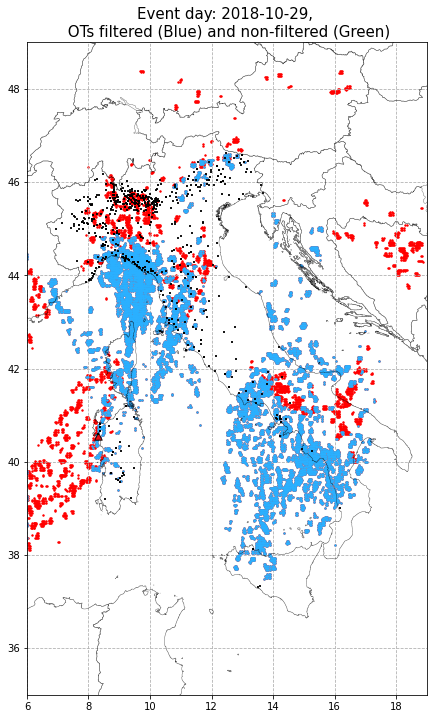

In [31]:
fig, ax = plt.subplots(figsize = (20,12))

plt.xlim(x_lim)
plt.ylim(y_lim) #y_lim

#filtered and non-filtered OTs detections    
for hour in orig_OT.keys():
    orig_OT[hour][['otpmax','geometry']].plot(ax=ax, markersize=2, figsize=(12, 8), column='otpmax', 
                                              color='red', zorder=1)
    if len(filt_OT[hour]) != 0:
        filt_OT[hour][['otpmax','geometry']].plot(ax=ax, markersize=2, figsize=(12, 8), column='otpmax', 
                                                  color='#2ab0ff', zorder=2)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

#eswd 
if len(eswd_ev_sel) != 0:
    pl.scatter(eswd_ev_sel.lon,eswd_ev_sel.lat,55,c='red',marker="^",edgecolor='k',alpha=0.9,zorder=4)
    
#unipol
if len(u_ev_sel) != 0:
    pl.scatter(u_ev_sel.lon,u_ev_sel.lat,5,c='black',marker="+",edgecolor='k',alpha=0.9,zorder=4, 
           label='UNIPOL reports')
    
plt.grid(ls='--', )

plt.title(f'Event day: {dtime.year}-{dtime.month:02d}-{dtime.day:02d}, \n OTs filtered (Blue) and non-filtered (Green)',
         fontsize=15);

pl.savefig(plt_fold + f"/2016-2018_comparison/{dtime.year}/{dtime}_VAIA.svg",dpi=200, bbox_inches='tight')

In [ ]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs
allOTs_dtime.plot(ax=ax, markersize=1, column='otpmax', color='green', zorder=2, 
                    label=f'{len(allOTs_dtime)} OTs (unfilt)')   
filtOTs_dtime.plot(ax=ax, markersize=1, column='otpmax', color='blue', zorder=2, 
                    label=f'{len(filtOTs_dtime)} OTs (filt)')   

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#ESWD REPORTS:
pl.scatter(ESWD_dtime.lon, ESWD_dtime.lat, 
           10*ESWD_dtime['size'] + 10, c='red',marker="^", edgecolor='k',alpha=0.9, zorder=5, 
           label=f'{len(ESWD_dtime)} ESWD reports')

plt.title(f'{dtime.strftime("%Y-%m-%d")}', fontsize=15);
plt.legend(loc='best', fontsize=12)

### - Aggregate 1 or more years together:

In [ ]:
d_ind = 160
day = days_2016_df['day'][d_ind]
dtime = days_2016_df['dtime'][d_ind]

In [6]:
OT_2016 = dict()

for d_ind in days_2016_df.index:
    
    day = days_2016_df['day'][d_ind]
    dtime = days_2016_df['dtime'][d_ind]
    
    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2016[day] = OT_dict

In [7]:
OT_2017 = dict()

for d_ind in days_2017_df.index:
    
    day = days_2017_df['day'][d_ind]
    dtime = days_2017_df['dtime'][d_ind]
    
    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2017[day] = OT_dict

In [8]:
OT_2018 = dict()

for d_ind in days_2018_df.index:
    
    day = days_2018_df['day'][d_ind]
    dtime = days_2018_df['dtime'][d_ind]

    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2018[day] = OT_dict

In [9]:
#extract the full sets of all OTs and filtered OTs considering the whole sample of events

all_OTset_2016 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_2016 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])

for d_ind in days_2016_df.index:
    
    day = days_2016_df['day'][d_ind]
    
    OTday_hours = OT_2016[day]['ORIGINAL_OTs'].keys()
    
    for hour in OTday_hours:
        
        all_OTset_2016 = all_OTset_2016.append(OT_2016[day]['ORIGINAL_OTs'][hour].reset_index(drop=True))
        filt_OTset_2016 = filt_OTset_2016.append(OT_2016[day]['FILTERED_OTs'][hour].reset_index(drop=True))

all_OTset_2016 = all_OTset_2016.reset_index(drop=True)
filt_OTset_2016 = filt_OTset_2016.reset_index(drop=True) 

#select the set of removed OTs with filtering:
remv_OTset_2016 = all_OTset_2016.merge(filt_OTset_2016, how='left', indicator=True)
remv_OTset_2016 = remv_OTset_2016[remv_OTset_2016['_merge']=='left_only'].drop(columns=['_merge'])

#select OTs only over LAND:
all_OTset_2016_land = gpd.clip(all_OTset_2016, sfg_land).sort_index()
filt_OTset_2016_land = gpd.clip(filt_OTset_2016, sfg_land).sort_index()
remv_OTset_2016_land = gpd.clip(remv_OTset_2016, sfg_land).sort_index()

In [10]:
#extract the full sets of all OTs and filtered OTs considering the whole sample of events

all_OTset_2017 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_2017 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])

for d_ind in days_2017_df.index:
    
    day = days_2017_df['day'][d_ind]
    
    OTday_hours = OT_2017[day]['ORIGINAL_OTs'].keys()
    
    for hour in OTday_hours:
        
        all_OTset_2017 = all_OTset_2017.append(OT_2017[day]['ORIGINAL_OTs'][hour].reset_index(drop=True))
        filt_OTset_2017 = filt_OTset_2017.append(OT_2017[day]['FILTERED_OTs'][hour].reset_index(drop=True))

all_OTset_2017 = all_OTset_2017.reset_index(drop=True)
filt_OTset_2017 = filt_OTset_2017.reset_index(drop=True) 

#select the set of removed OTs with filtering:
remv_OTset_2017 = all_OTset_2017.merge(filt_OTset_2017, how='left', indicator=True)
remv_OTset_2017 = remv_OTset_2017[remv_OTset_2017['_merge']=='left_only'].drop(columns=['_merge'])

#select OTs only over LAND:
all_OTset_2017_land = gpd.clip(all_OTset_2017, sfg_land).sort_index()
filt_OTset_2017_land = gpd.clip(filt_OTset_2017, sfg_land).sort_index()
remv_OTset_2017_land = gpd.clip(remv_OTset_2017, sfg_land).sort_index()

In [11]:
#extract the full sets of all OTs and filtered OTs considering the whole sample of events

all_OTset_2018 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_2018 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])

for d_ind in days_2018_df.index:
    
    day = days_2018_df['day'][d_ind]
    
    OTday_hours = OT_2018[day]['ORIGINAL_OTs'].keys()
    
    for hour in OTday_hours:
        
        all_OTset_2018 = all_OTset_2018.append(OT_2018[day]['ORIGINAL_OTs'][hour].reset_index(drop=True))
        filt_OTset_2018 = filt_OTset_2018.append(OT_2018[day]['FILTERED_OTs'][hour].reset_index(drop=True))

all_OTset_2018 = all_OTset_2018.reset_index(drop=True)
filt_OTset_2018 = filt_OTset_2018.reset_index(drop=True) 

#select the set of removed OTs with filtering:
remv_OTset_2018 = all_OTset_2018.merge(filt_OTset_2018, how='left', indicator=True)
remv_OTset_2018 = remv_OTset_2018[remv_OTset_2018['_merge']=='left_only'].drop(columns=['_merge'])

#select OTs only over LAND:
all_OTset_2018_land = gpd.clip(all_OTset_2018, sfg_land).sort_index()
filt_OTset_2018_land = gpd.clip(filt_OTset_2018, sfg_land).sort_index()
remv_OTset_2018_land = gpd.clip(remv_OTset_2018, sfg_land).sort_index()

In [12]:
remv_OTset_2016_land = gpd.clip(remv_OTset_2016, sfg_land).sort_index()
remv_OTset_2017_land = gpd.clip(remv_OTset_2017, sfg_land).sort_index()
remv_OTset_2018_land = gpd.clip(remv_OTset_2018, sfg_land).sort_index()

In [13]:
#Join the three years together:
all_OTset_2016_2017_2018 = pd.concat([all_OTset_2016, all_OTset_2017, all_OTset_2018])
filt_OTset_2016_2017_2018 = pd.concat([filt_OTset_2016, filt_OTset_2017, filt_OTset_2018])
remv_OTset_2016_2017_2018 = pd.concat([remv_OTset_2016, remv_OTset_2017, remv_OTset_2018])

all_OTset_2016_2017_2018_land = gpd.clip(all_OTset_2016_2017_2018, sfg_land).sort_index()
filt_OTset_2016_2017_2018_land = gpd.clip(filt_OTset_2016_2017_2018, sfg_land).sort_index()
remv_OTset_2016_2017_2018_land = gpd.clip(remv_OTset_2016_2017_2018, sfg_land).sort_index()

### - 2016:

In 2016 211 days (in Apr-Oct) were considered. 

A total of **171947** OTs (with p>=50%) were detected, (over **LAND**: **106094**, i.e. 61.7% of the total)

After filtering **126599** OTs were retained (**73.6%**), (over **LAND**: **75568**, i.e. 71.2% of the total over LAND), meaning that overall **45348** were removed (26.4%)

### -2017:

In 2017 213 days (in Apr-Oct) were considered.

A total of **189613** OTs (with p>=50%) were detected, (over **LAND**: **133634**, i.e. 70.5% of the total)

After filtering **143468** OTs were retained (**75.7%**), (over **LAND**: **100892**, i.e. 75.5% of the total over LAND), meaning that overall **46145** were removed (24.3%)

### -2018

In 2018 212 days (in Apr-Oct) were considered.

A total of **270840** OTs (with p>=50%) were detected, (over **LAND**: **152012**, i.e. 56.1% of the total)

After filtering **198823** OTs were retained (**73.4%**), (over **LAND**: **106579**, i.e. 70.1% of the total over LAND), meaning that overall **72017** were removed (26.6%)

<span style="color:red"> **STRANGE THING IN 2018 DATA**: the majority of OTs are detected in October: 73449 (>27%!)!! WHY?? If considering only land data: 19738 (13%), see charts below. Furthermore July and September are the least populated months after April. </span>.

### - 2016-2018

In 2016-2018 a total of 636 days were considered.

A total of **632400** OTs (with p>=50%) were detected, (over **LAND**: **391740**, i.e. 61.9% of the total)

After filtering **468890** OTs were retained (**74.1%**), (over **LAND**: **283039**, i.e. 72.3% of the total over LAND), meaning that overall **163510** were removed (25.9%)

### - Investigation/quality check original OT set:

In [14]:
all_OTset_2016_2017_2018_dailySum = all_OTset_2016_2017_2018

#new column of N_OT values to sum over the days
all_OTset_2016_2017_2018_dailySum['N_OT'] = 1

all_OTset_2016_2017_2018_dailySum['time'] = pd.to_datetime(all_OTset_2016_2017_2018_dailySum['time'])
all_OTset_2016_2017_2018_dailySum.index = pd.to_datetime(all_OTset_2016_2017_2018_dailySum.time)

all_OTset_2016_2017_2018_dailySum = all_OTset_2016_2017_2018_dailySum.drop(columns=['lon','lat','otpmax','time'])

#calculate daily sum of OT
all_OTset_2016_2017_2018_dailySum = all_OTset_2016_2017_2018_dailySum.resample('D').sum()
all_OTset_2016_2017_2018_dailySum.index = pd.to_datetime(all_OTset_2016_2017_2018_dailySum.index.strftime("%d-%m-%Y"))

In [15]:
all_OTset_2016_2017_2018_dailySum = all_OTset_2016_2017_2018
all_OTset_2016_2017_2018_dailySum['time'] = pd.to_datetime(all_OTset_2016_2017_2018_dailySum['time'])

#column of daily datetimes:
all_OTset_2016_2017_2018_dailySum['daily_time'] = pd.to_datetime(all_OTset_2016_2017_2018_dailySum['time'].dt.strftime("%Y-%m-%d"))

#new column of N_OT values to sum over the days
all_OTset_2016_2017_2018_dailySum['N_OT'] = 1

#separate the years for correct indices in resampling!!
all_OTset_2016_dailySum = all_OTset_2016_2017_2018_dailySum[all_OTset_2016_2017_2018_dailySum['time'].dt.year == 2016]
all_OTset_2017_dailySum = all_OTset_2016_2017_2018_dailySum[all_OTset_2016_2017_2018_dailySum['time'].dt.year == 2017]
all_OTset_2018_dailySum = all_OTset_2016_2017_2018_dailySum[all_OTset_2016_2017_2018_dailySum['time'].dt.year == 2018]

#sum over the day
all_OTset_2016_dailySum = all_OTset_2016_dailySum.resample('D', on='daily_time').sum()
all_OTset_2017_dailySum = all_OTset_2017_dailySum.resample('D', on='daily_time').sum()
all_OTset_2018_dailySum = all_OTset_2018_dailySum.resample('D', on='daily_time').sum()

all_OTset_2016_dailySum['time'] = all_OTset_2016_dailySum.index
all_OTset_2017_dailySum['time'] = all_OTset_2017_dailySum.index
all_OTset_2018_dailySum['time'] = all_OTset_2018_dailySum.index

all_OTset_2016_dailySum = all_OTset_2016_dailySum.reset_index().drop(columns=['daily_time','lon','lat','otpmax'])
all_OTset_2017_dailySum = all_OTset_2017_dailySum.reset_index().drop(columns=['daily_time','lon','lat','otpmax'])
all_OTset_2018_dailySum = all_OTset_2018_dailySum.reset_index().drop(columns=['daily_time','lon','lat','otpmax'])

#add 1st of april if missing for having same index starting same days each year:
all_OTset_2017_dailySum.loc[-1] = [0, pd.to_datetime('2017-04-01')]
all_OTset_2017_dailySum.index = all_OTset_2017_dailySum.index + 1  # shifting index
all_OTset_2017_dailySum = all_OTset_2017_dailySum.sort_index()

all_OTset_2018_dailySum.loc[-3] = [0, pd.to_datetime('2018-04-01')]
all_OTset_2018_dailySum.loc[-2] = [0, pd.to_datetime('2018-04-02')]
all_OTset_2018_dailySum.loc[-1] = [0, pd.to_datetime('2018-04-03')]
all_OTset_2018_dailySum.index = all_OTset_2018_dailySum.index + 3  # shifting index
all_OTset_2018_dailySum = all_OTset_2018_dailySum.sort_index()

#re-concat years together:
all_OTset_2016_2017_2018_dailySum = pd.concat([all_OTset_2016_dailySum, all_OTset_2017_dailySum, all_OTset_2018_dailySum])

In [19]:
#select the TOT days having largest number of OTs detected:
all_OTset_2016_dailySum_MAXs = all_OTset_2016_dailySum.sort_values('N_OT', ascending=False).head(20)
all_OTset_2017_dailySum_MAXs = all_OTset_2017_dailySum.sort_values('N_OT', ascending=False).head(20)
all_OTset_2018_dailySum_MAXs = all_OTset_2018_dailySum.sort_values('N_OT', ascending=False).head(20)

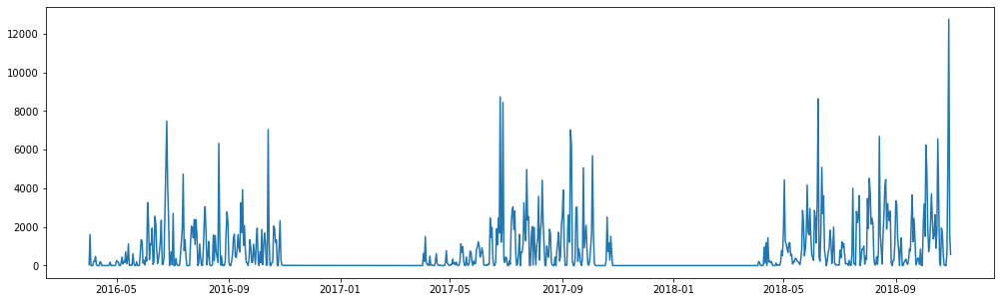

In [18]:
#Histogram of OTs distribution dep. on the hour of the day: CONCAT YEARS TOGETHER
fig, ax1 = plt.subplots(1, 1, figsize=(17,5))

ax1.plot(all_OTset_2016_2017_2018_dailySum['time'], all_OTset_2016_2017_2018_dailySum['N_OT'])

Text(0.5, 0.91, 'OT daily counts')

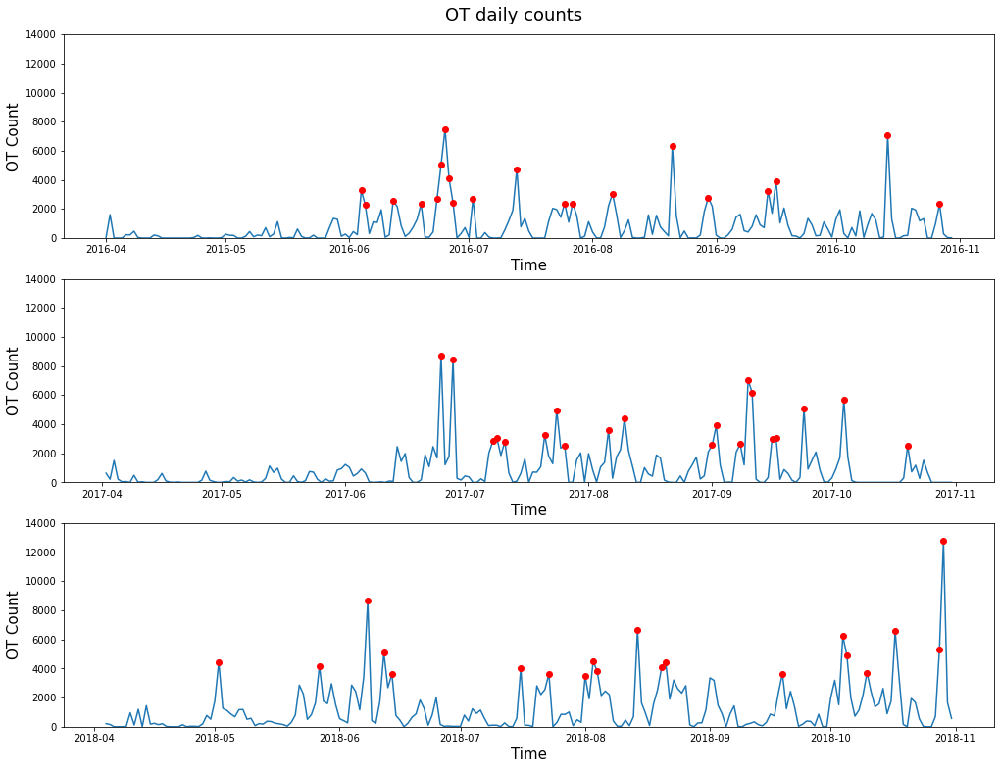

In [179]:
#Histogram of OTs distribution dep. on the day
fig, (ax1,ax2,ax3) = plt.subplots(3, 1, figsize=(17,13))

ax1.plot(all_OTset_2016_dailySum['time'], all_OTset_2016_dailySum['N_OT'])
ax1.plot(all_OTset_2016_dailySum_MAXs['time'], all_OTset_2016_dailySum_MAXs['N_OT'], 
         color='red', marker='o', ls=' ')
ax1.set_ylabel('OT Count', fontsize=15)
ax1.set_xlabel('Time', fontsize=15)
ax1.set_ylim([0,14000])

ax2.plot(all_OTset_2017_dailySum['time'], all_OTset_2017_dailySum['N_OT'])
ax2.plot(all_OTset_2017_dailySum_MAXs['time'], all_OTset_2017_dailySum_MAXs['N_OT'], 
         color='red', marker='o', ls=' ')
ax2.set_ylabel('OT Count', fontsize=15)
ax2.set_xlabel('Time', fontsize=15)
ax2.set_ylim([0,14000])

ax3.plot(all_OTset_2018_dailySum['time'], all_OTset_2018_dailySum['N_OT'])
ax3.plot(all_OTset_2018_dailySum_MAXs['time'], all_OTset_2018_dailySum_MAXs['N_OT'], 
         color='red', marker='o', ls=' ')
ax3.set_ylabel('OT Count', fontsize=15)
ax3.set_xlabel('Time', fontsize=15)
ax3.set_ylim([0,14000])

fig.suptitle('OT daily counts', y=0.91, fontsize=18)

In [20]:
all_OTset_2017_dailySum_MAXs

,N_OT,time
85,8737,2017-06-25
88,8452,2017-06-28
162,7027,2017-09-10
163,6185,2017-09-11
186,5691,2017-10-04
176,5070,2017-09-24
114,4976,2017-07-24
131,4422,2017-08-10
154,3914,2017-09-02
127,3584,2017-08-06


In [26]:
pd.to_datetime(all_OTset_2017.time).dt.strftime("%Y-%m-%d")

0         2017-04-02
1         2017-04-02
2         2017-04-02
3         2017-04-02
4         2017-04-02
             ...    
189608    2017-10-25
189609    2017-10-25
189610    2017-10-25
189611    2017-10-28
189612    2017-10-31
Name: time, Length: 189613, dtype: object

In [29]:
pd.to_datetime(all_OTset_2017[pd.to_datetime(all_OTset_2017.time).dt.strftime("%Y-%m-%d") == '2017-06-25'].time).dt.hour

32707     0
32708     0
32709     0
32710     0
32711     0
         ..
41439    21
41440    21
41441    21
41442    21
41443    21
Name: time, Length: 8737, dtype: int64

Text(0.5, 0, 'Hour of the day (UTC)')

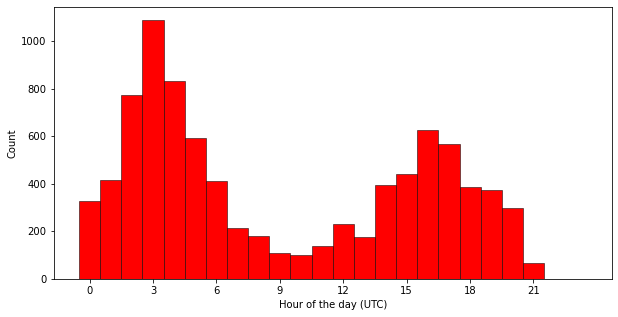

In [30]:
fig, ax1 = plt.subplots(1, 1, figsize=(10,5))

ax1.hist(pd.to_datetime(all_OTset_2017[pd.to_datetime(all_OTset_2017.time).dt.strftime("%Y-%m-%d") == '2017-06-25'].time).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(0, 24, 3))
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Hour of the day (UTC)', fontsize=10)
#ax1.set_title('Original (UNfiltered set) - 2016', fontsize=15);
#ax1.set_ylim([0,14000])

#### - Plot same daily distribution with ESWD reports and compare with OT distr.

In [121]:
df_eswd = pd.read_csv(fold + 'hail4_punge/ESWD/ESWD_HAIL_19790101-20200531_v1_6.csv')   #Swabian Jura 2013

In [124]:
eswd_df = pd.DataFrame(columns=['datetime','lat','lon','size','QC_level'])
eswd_df['datetime'] = pd.to_datetime(df_eswd['TIME_EVENT'])
eswd_df['lat'] = df_eswd['LATITUDE']
eswd_df['lon'] = df_eswd['LONGITUDE']
eswd_df['size'] = df_eswd['MAX_HAIL_DIAMETER']
eswd_df['QC_level'] = df_eswd['QC_LEVEL']
eswd_df['Time_accuracy'] = df_eswd['TIME_ACCURACY']
eswd_df['Max_hailst_weight'] = df_eswd['MAX_HAILSTONE_WEIGHT']
eswd_df['Thickness_hail_layer'] = df_eswd['THICKNESS_HAIL_LAYER']
eswd_df['Total_damage'] = df_eswd['TOTAL_DAMAGE']
eswd_df['N_injured'] = df_eswd['NO_INJURED']
eswd_df['N_killed'] = df_eswd['NO_KILLED']
eswd_df['Impacts'] = df_eswd['IMPACTS']

eswd_df = eswd_df.sort_values(by='datetime').reset_index(drop=True)

#try:retain only data in the selected day and year and within hhmin and hhmax, as well as within latmin,latmax and lonmin,lonmax
eswd_df_years = eswd_df.datetime.apply(lambda x: x.year)
eswd_df_months = eswd_df.datetime.apply(lambda x: x.month)
eswd_df_days = eswd_df.datetime.apply(lambda x: x.day)
eswd_df_hours = eswd_df.datetime.apply(lambda x: x.hour)

eswd_df_sel = eswd_df.loc[(eswd_df_years >= 2016) & (eswd_df_years <= 2018) & (eswd_df_months >= 4)   #(eswd_df_years >= 1995) &
                         & (eswd_df_months <= 10)]
eswd_df_sel = eswd_df_sel.loc[(eswd_df_sel.lat >= latmin) & (eswd_df_sel.lat <= latmax)]
eswd_ev_sel = eswd_df_sel.loc[(eswd_df_sel.lon >= lonmin) & (eswd_df_sel.lon <= lonmax)].reset_index(drop=True)

#geodataframe:
eswd = gpd.GeoDataFrame(eswd_ev_sel, geometry=gpd.points_from_xy(eswd_ev_sel.lon, eswd_ev_sel.lat))

#remove data too close to sphera border!!:
L = [128,316,327,328,330,507,632,883,884,929]
eswd = eswd.drop(L)

#split eswd dataset in the years:
eswd_2016 = eswd[eswd.datetime.dt.year ==2016]
eswd_2017 = eswd[eswd.datetime.dt.year ==2017]
eswd_2018 = eswd[eswd.datetime.dt.year ==2018]

In [303]:
eswd_dailySum = eswd

#column of daily datetimes:
eswd_dailySum['daily_time'] = pd.to_datetime(eswd_dailySum['datetime'].dt.strftime("%Y-%m-%d"))

#new column of N_eswd values to sum over the days
eswd_dailySum['N_eswd'] = 1

#separate the years for correct indices in resampling!!
eswd_2016_dailySum = eswd_dailySum[eswd_dailySum['daily_time'].dt.year == 2016]
eswd_2017_dailySum = eswd_dailySum[eswd_dailySum['daily_time'].dt.year == 2017]
eswd_2018_dailySum = eswd_dailySum[eswd_dailySum['daily_time'].dt.year == 2018]

#sum over the day
eswd_2016_dailySum = eswd_2016_dailySum.resample('D', on='daily_time').sum()
eswd_2017_dailySum = eswd_2017_dailySum.resample('D', on='daily_time').sum()
eswd_2018_dailySum = eswd_2018_dailySum.resample('D', on='daily_time').sum()

eswd_2016_dailySum['time'] = eswd_2016_dailySum.index
eswd_2017_dailySum['time'] = eswd_2017_dailySum.index
eswd_2018_dailySum['time'] = eswd_2018_dailySum.index

eswd_2016_dailySum = eswd_2016_dailySum.reset_index().drop(columns=['daily_time','lon','lat','size'])
eswd_2017_dailySum = eswd_2017_dailySum.reset_index().drop(columns=['daily_time','lon','lat','size'])
eswd_2018_dailySum = eswd_2018_dailySum.reset_index().drop(columns=['daily_time','lon','lat','size'])

#drop rows with 0 values:
eswd_2016_dailySum_Non0 = eswd_2016_dailySum[eswd_2016_dailySum['N_eswd'] != 0]
eswd_2017_dailySum_Non0 = eswd_2017_dailySum[eswd_2017_dailySum['N_eswd'] != 0]
eswd_2018_dailySum_Non0 = eswd_2018_dailySum[eswd_2018_dailySum['N_eswd'] != 0]

#re-concat years together:
eswd_2016_2017_2018_dailySum = pd.concat([eswd_2016_dailySum, eswd_2017_dailySum, eswd_2018_dailySum])

Text(0.5, 0.91, 'ESWD reports counts')

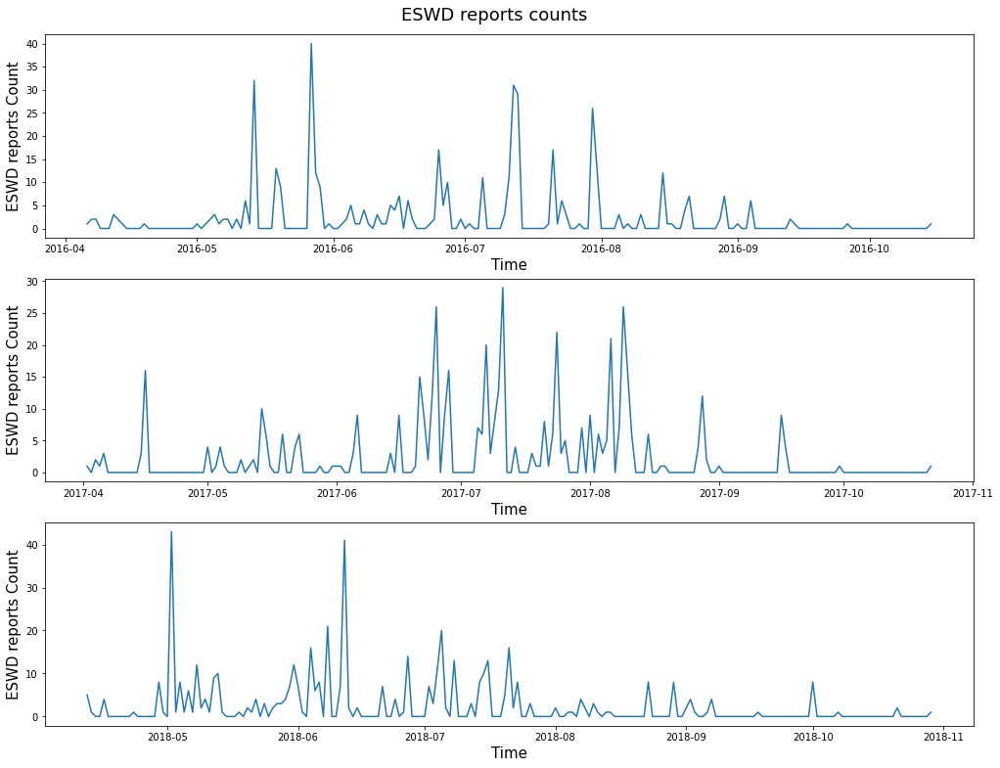

In [237]:
#Histogram of ESWD distribution dep. on day
fig, (ax1,ax2,ax3) = plt.subplots(3, 1, figsize=(17,13))

ax1.plot(eswd_2016_dailySum['time'], eswd_2016_dailySum['N_eswd'])
#ax1.plot(all_OTset_2016_dailySum_MAXs['time'], all_OTset_2016_dailySum_MAXs['N_OT'], 
#         color='red', marker='o', ls=' ')
ax1.set_ylabel('ESWD reports Count', fontsize=15)
ax1.set_xlabel('Time', fontsize=15)
#ax1.set_ylim([0,14000])

ax2.plot(eswd_2017_dailySum['time'], eswd_2017_dailySum['N_eswd'])
#x2.plot(all_OTset_2017_dailySum_MAXs['time'], all_OTset_2017_dailySum_MAXs['N_OT'], 
#         color='red', marker='o', ls=' ')
ax2.set_ylabel('ESWD reports Count', fontsize=15)
ax2.set_xlabel('Time', fontsize=15)
#ax2.set_ylim([0,14000])

ax3.plot(eswd_2018_dailySum['time'], eswd_2018_dailySum['N_eswd'])
#ax3.plot(all_OTset_2018_dailySum_MAXs['time'], all_OTset_2018_dailySum_MAXs['N_OT'], 
#         color='red', marker='o', ls=' ')
ax3.set_ylabel('ESWD reports Count', fontsize=15)
ax3.set_xlabel('Time', fontsize=15)
#ax3.set_ylim([0,14000])

fig.suptitle('ESWD reports counts', y=0.91, fontsize=18)

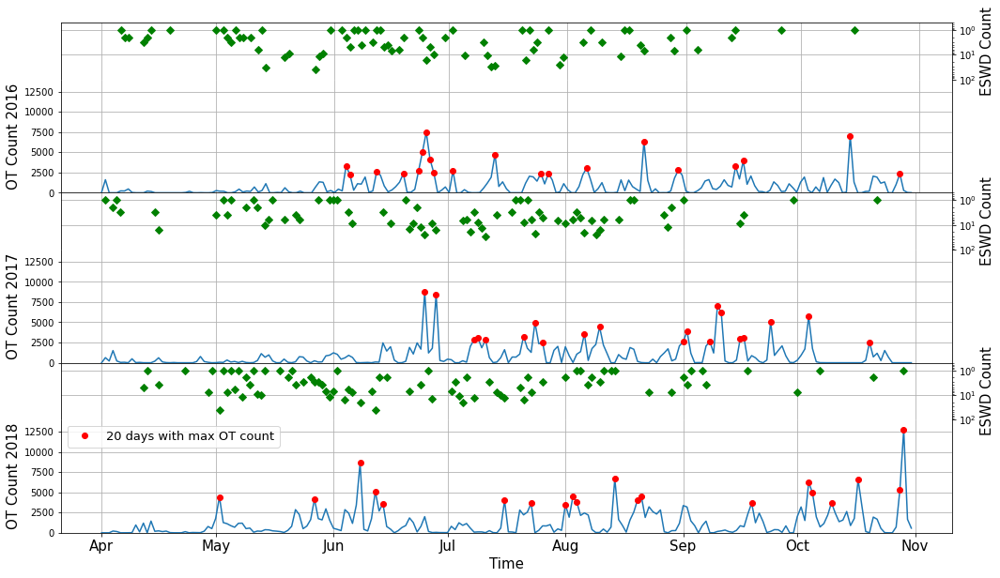

In [360]:
#Histogram of OTs distribution dep. on the day
fig, (ax1_top, ax1, ax2_top, ax2, ax3_top, ax3) = plt.subplots(6, 1, figsize=(17,10))


ax1_top = plt.subplot2grid((9,1), (0,0), rowspan=1, colspan=1)
plt.ylabel('ESWD Count', fontsize=15)
ax1 = plt.subplot2grid((9,1), (1,0), rowspan=2, colspan=1, sharex=ax1_top)

ax1_top.plot(eswd_2016_dailySum_Non0['time'], eswd_2016_dailySum_Non0['N_eswd'], color='green', marker='D', ls='')
ax1_top.invert_yaxis()
ax1_top.grid(True)
ax1_top.yaxis.tick_right()
ax1_top.yaxis.set_label_position("right")
ax1_top.spines["bottom"].set_visible(False)
ax1_top.set_ylim([100,0.5])
ax1_top.set_yscale('log')

ax1.plot(all_OTset_2016_dailySum['time'], all_OTset_2016_dailySum['N_OT'])
ax1.plot(all_OTset_2016_dailySum_MAXs['time'], all_OTset_2016_dailySum_MAXs['N_OT'], 
         color='red', marker='o', ls=' ')
ax1.set_ylabel('OT Count 2016', fontsize=15)
ax1.set_xlabel('Time', fontsize=15)
ax1.set_ylim([0,14000])
ax1.grid(True)
ax1.spines["top"].set_visible(False)
plt.setp(ax1_top.get_xticklabels(), visible=False)


ax2_top = plt.subplot2grid((9,1), (3,0), rowspan=1, colspan=1)
plt.ylabel('ESWD Count', fontsize=15)
ax2 = plt.subplot2grid((9,1), (4,0), rowspan=2, colspan=1, sharex=ax2_top)

ax2_top.plot(eswd_2017_dailySum_Non0['time'], eswd_2017_dailySum_Non0['N_eswd'], color='green', marker='D', ls='')
ax2_top.invert_yaxis()
ax2_top.grid(True)
ax2_top.yaxis.tick_right()
ax2_top.yaxis.set_label_position("right")
ax2_top.spines["bottom"].set_visible(False)
#ax2_top.set_ylim([50,-5])
ax2_top.set_ylim([100,0.5])
ax2_top.set_yscale('log')

ax2.plot(all_OTset_2017_dailySum['time'], all_OTset_2017_dailySum['N_OT'])
ax2.plot(all_OTset_2017_dailySum_MAXs['time'], all_OTset_2017_dailySum_MAXs['N_OT'], 
         color='red', marker='o', ls=' ')
ax2.set_ylabel('OT Count 2017', fontsize=15)
ax2.set_xlabel('Time', fontsize=15)
ax2.set_ylim([0,14000])
ax2.grid(True)
ax2.spines["top"].set_visible(False)
plt.setp(ax2_top.get_xticklabels(), visible=False)


ax3_top = plt.subplot2grid((9,1), (6,0), rowspan=1, colspan=1)
plt.ylabel('ESWD Count', fontsize=15)
ax3 = plt.subplot2grid((9,1), (7,0), rowspan=2, colspan=1, sharex=ax3_top)

ax3_top.plot(eswd_2018_dailySum_Non0['time'], eswd_2018_dailySum_Non0['N_eswd'], color='green', marker='D', ls='',
            label='ESWD reports count')
ax3_top.invert_yaxis()
ax3_top.grid(True)
ax3_top.yaxis.tick_right()
ax3_top.yaxis.set_label_position("right")
ax3_top.spines["bottom"].set_visible(False)
#ax3_top.set_ylim([50,-5])
ax3_top.set_ylim([100,0.5])
ax3_top.set_yscale('log')

ax3.plot(all_OTset_2018_dailySum['time'], all_OTset_2018_dailySum['N_OT'])
ax3.plot(all_OTset_2018_dailySum_MAXs['time'], all_OTset_2018_dailySum_MAXs['N_OT'], 
         color='red', marker='o', ls=' ', label='20 days with max OT count')
ax3.set_ylabel('OT Count 2018', fontsize=15)
ax3.set_xlabel('Time', fontsize=15)
ax3.set_ylim([0,14000])
ax3.grid(True)
ax3.spines["top"].set_visible(False)
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct','Nov'], minor=False, fontsize=15)
plt.legend(loc='best', fontsize=13)

plt.setp(ax3_top.get_xticklabels(), visible=False)
plt.subplots_adjust(hspace=0.0)

Investigate days with large amounts of OTs:

In [411]:
all_OTset_2016_dailySum_MAXs

,N_OT,time
85,7482,2016-06-25
196,7042,2016-10-14
142,6329,2016-08-21
84,5024,2016-06-24
103,4737,2016-07-13
86,4101,2016-06-26
168,3937,2016-09-16
64,3265,2016-06-04
166,3252,2016-09-14
127,3051,2016-08-06


In [433]:
filt_OTset_2016_2017_2018['time'] = pd.to_datetime(filt_OTset_2016_2017_2018['time'])

In [29]:
all_OTset_2016_dailySum.time[81]

Timestamp('2016-06-21 00:00:00')

In [34]:
filt_OTset_2016_2017_2018.time = pd.to_datetime(filt_OTset_2016_2017_2018.time)

In [43]:
all_OTset_2016_dailySum.time[123]

Timestamp('2016-08-02 00:00:00')

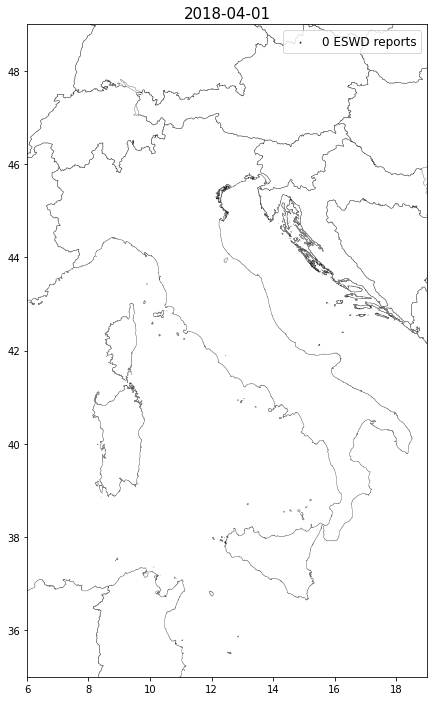

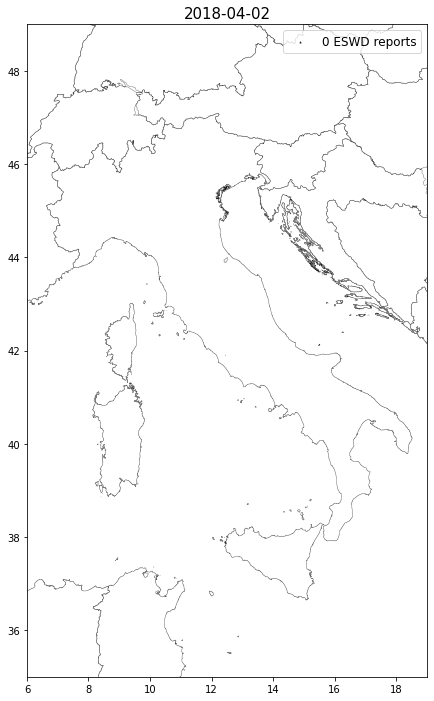

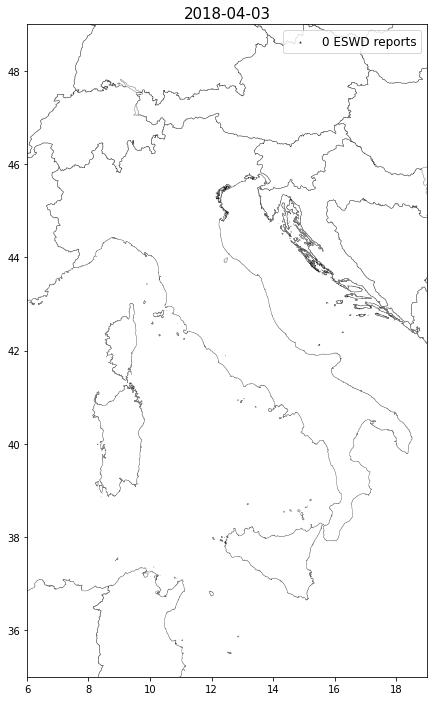

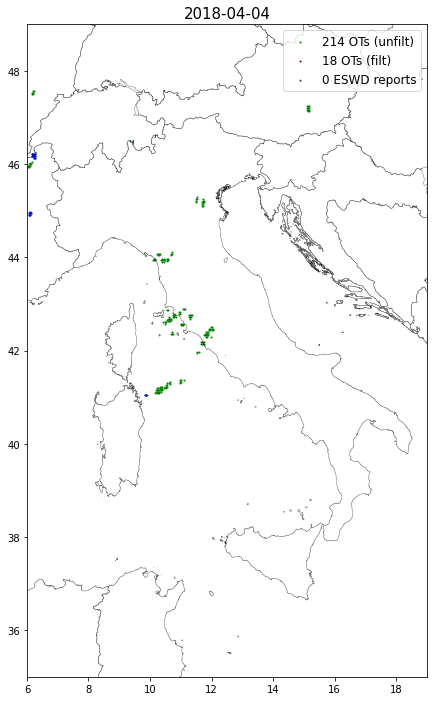

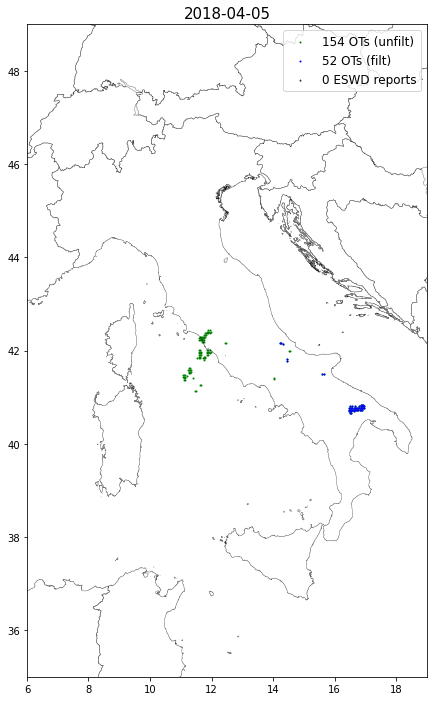

...

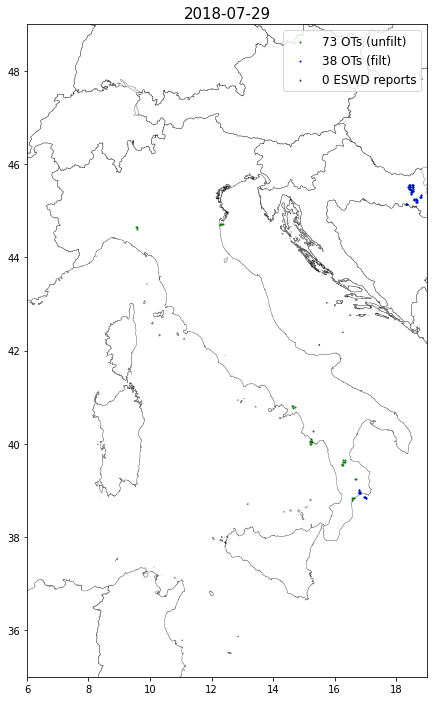

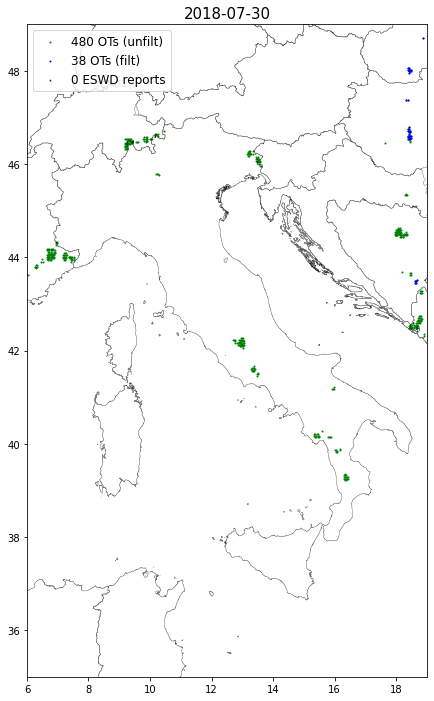

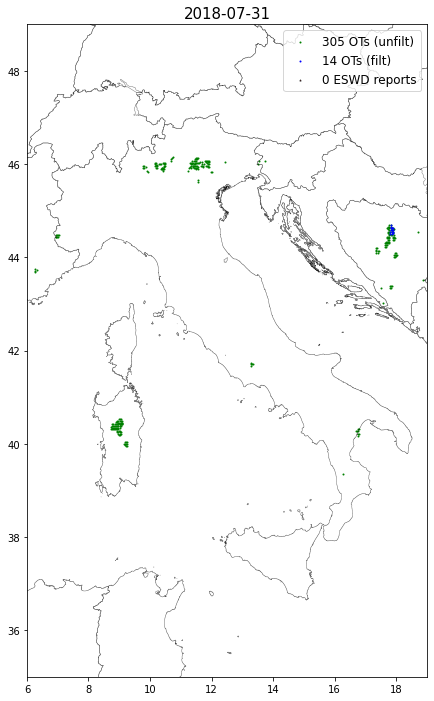

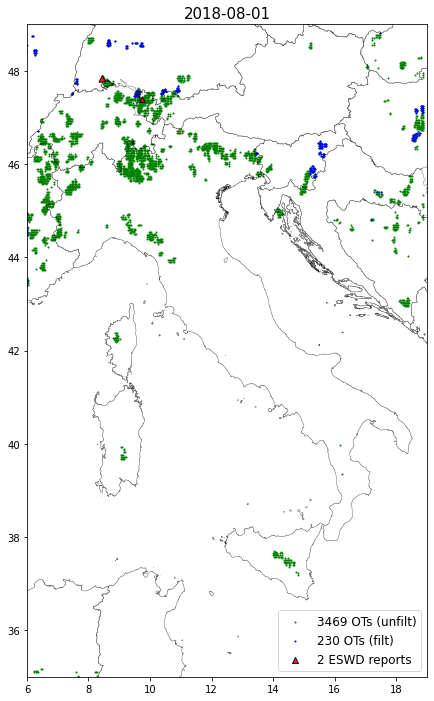

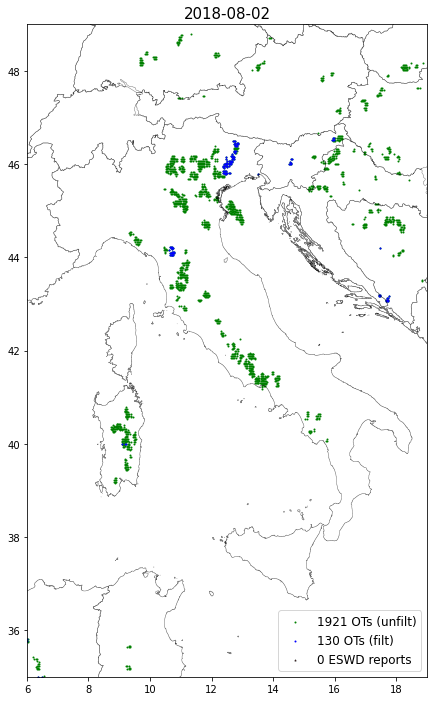

In [46]:
for dtime in all_OTset_2018_dailySum.time[:124]:
    
    allOTs_dtime = all_OTset_2016_2017_2018[(all_OTset_2016_2017_2018.time.dt.year==dtime.year) & 
                         (all_OTset_2016_2017_2018.time.dt.month==dtime.month) &
                         (all_OTset_2016_2017_2018.time.dt.day==dtime.day)]
    filtOTs_dtime = filt_OTset_2016_2017_2018[(filt_OTset_2016_2017_2018.time.dt.year==dtime.year) & 
                             (filt_OTset_2016_2017_2018.time.dt.month==dtime.month) &
                             (filt_OTset_2016_2017_2018.time.dt.day==dtime.day)]
    ESWD_dtime = eswd[(eswd.datetime.dt.year==dtime.year) & (eswd.datetime.dt.month==dtime.month) & 
                           (eswd.datetime.dt.day==dtime.day)]
    
    fig, ax = plt.subplots(figsize = (20,12))

    plt.ylim(y_lim) #y_lim
    plt.xlim(x_lim)  #x_lim

    #OTs
    allOTs_dtime.plot(ax=ax, markersize=1, column='otpmax', color='green', zorder=2, 
                        label=f'{len(allOTs_dtime)} OTs (unfilt)')   
    filtOTs_dtime.plot(ax=ax, markersize=1, column='otpmax', color='blue', zorder=2, 
                        label=f'{len(filtOTs_dtime)} OTs (filt)')   

    #shapefiles    
    for shp in sf_geo:
        shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

    #ESWD REPORTS:
    pl.scatter(ESWD_dtime.lon, ESWD_dtime.lat, 
               10*ESWD_dtime['size']+10, c='red',marker="^", edgecolor='k',alpha=0.9, zorder=5, 
               label=f'{len(ESWD_dtime)} ESWD reports')

    plt.title(f'{dtime.strftime("%Y-%m-%d")}', fontsize=15);
    plt.legend(loc='best', fontsize=12)
    
    pl.savefig(plt_fold + f"/2016-2018_comparison/{dtime.year}/{dtime}.png",dpi=200, bbox_inches='tight')

In [435]:
dtime = pd.to_datetime('2017-06-25')

allOTs_dtime = all_OTset_2016_2017_2018[(all_OTset_2016_2017_2018.time.dt.year==dtime.year) & 
                         (all_OTset_2016_2017_2018.time.dt.month==dtime.month) &
                         (all_OTset_2016_2017_2018.time.dt.day==dtime.day)]
filtOTs_dtime = filt_OTset_2016_2017_2018[(filt_OTset_2016_2017_2018.time.dt.year==dtime.year) & 
                         (filt_OTset_2016_2017_2018.time.dt.month==dtime.month) &
                         (filt_OTset_2016_2017_2018.time.dt.day==dtime.day)]
ESWD_dtime = eswd[(eswd.datetime.dt.year==dtime.year) & (eswd.datetime.dt.month==dtime.month) & 
                       (eswd.datetime.dt.day==dtime.day)]

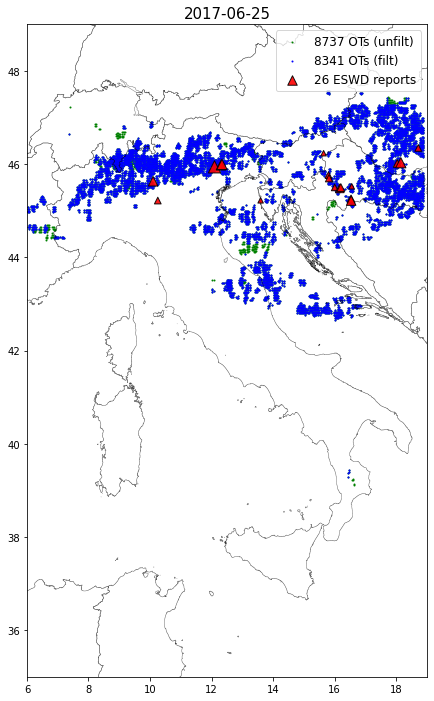

In [436]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs
allOTs_dtime.plot(ax=ax, markersize=1, column='otpmax', color='green', zorder=2, 
                    label=f'{len(allOTs_dtime)} OTs (unfilt)')   
filtOTs_dtime.plot(ax=ax, markersize=1, column='otpmax', color='blue', zorder=2, 
                    label=f'{len(filtOTs_dtime)} OTs (filt)')   

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#ESWD REPORTS:
pl.scatter(ESWD_dtime.lon, ESWD_dtime.lat, 
           10*ESWD_dtime['size'] + 10, c='red',marker="^", edgecolor='k',alpha=0.9, zorder=5, 
           label=f'{len(ESWD_dtime)} ESWD reports')

plt.title(f'{dtime.strftime("%Y-%m-%d")}', fontsize=15);
plt.legend(loc='best', fontsize=12)

### - CDF of OT count per day 

In [19]:
all_OTset_2016_2017_2018_dailySum

,N_OT,time
0,48,2016-04-01
1,1609,2016-04-02
2,0,2016-04-03
3,0,2016-04-04
4,0,2016-04-05
...,...,...
209,703,2018-10-27
210,5324,2018-10-28
211,12754,2018-10-29
212,1663,2018-10-30


In [20]:
NON0_all_OTset_2016_2017_2018_dailySum = all_OTset_2016_2017_2018_dailySum[all_OTset_2016_2017_2018_dailySum['N_OT']!= 0]
NON0_all_OTset_2016_2017_2018_dailySum

,N_OT,time
0,48,2016-04-01
1,1609,2016-04-02
5,226,2016-04-06
6,215,2016-04-07
7,466,2016-04-08
...,...,...
209,703,2018-10-27
210,5324,2018-10-28
211,12754,2018-10-29
212,1663,2018-10-30


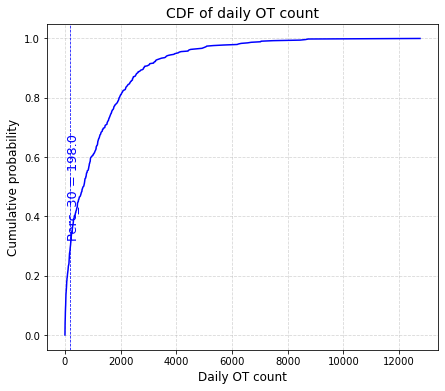

In [31]:
fig, ax = plt.subplots(figsize = (7,6))

data = NON0_all_OTset_2016_2017_2018_dailySum['N_OT']

#sort data
x = np.sort(data)

#calculate CDF values
y = 1. * np.arange(len(data)) / (len(data) - 1)

#plot CDF
ax.plot(x, y, color='blue')

ax.set_xlabel(f'Daily OT count', fontsize=12)
ax.set_ylabel('Cumulative probability', fontsize=12)
ax.set_title(f'CDF of daily OT count', fontsize=14);

#percentile 2
percent=30
plt.axvline(x=np.percentile(x,percent), lw=0.75, linestyle='--', color='blue')

plt.text(np.percentile(x,percent)*(1-0.8), .5, f"Perc_{percent} = {np.percentile(x,percent):.5}", 
         rotation=90, verticalalignment='center', color='blue', fontsize=13)
plt.grid(ls='--', alpha=0.5)

In [ ]:
np.percentile(x,30)

### - Identify all days with less than 200 OTs over 24 hours (this will be the definition of no-thunderstorm days)

In [110]:
all_OTset_2016_2017_2018 = pd.concat([all_OTset_2016, all_OTset_2017, all_OTset_2018])
all_OTset_2016_2017_2018['daily_time'] = pd.to_datetime(pd.to_datetime(all_OTset_2016_2017_2018['time']).
                                                        dt.strftime("%Y-%m-%d"))
filt_OTset_2016_2017_2018['daily_time'] = pd.to_datetime(pd.to_datetime(filt_OTset_2016_2017_2018['time']).
                                                        dt.strftime("%Y-%m-%d"))

In [89]:
#define no-thund/thund days based on OT daily sum threshold of 200 OTs:
noThund_OTs = all_OTset_2016_2017_2018_dailySum[all_OTset_2016_2017_2018_dailySum['N_OT']<= 200]
Thund_OTs = all_OTset_2016_2017_2018_dailySum[all_OTset_2016_2017_2018_dailySum['N_OT']> 200]
noThund_OTs

,N_OT,time
0,48,2016-04-01
2,0,2016-04-03
3,0,2016-04-04
4,0,2016-04-05
8,34,2016-04-09
...,...,...
201,161,2018-10-19
202,0,2018-10-20
206,21,2018-10-24
207,0,2018-10-25


In [149]:
#SELECT OTS SUBSET OF THUNDERSTORM DAYS
Thund_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[~all_OTset_2016_2017_2018['daily_time'].
                                                          isin(noThund_OTs.time)]
Thund_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[~filt_OTset_2016_2017_2018['daily_time'].
                                                          isin(noThund_OTs.time)]

#LAND OTs only:
Thund_all_OTset_2016_2017_2018_land = gpd.clip(Thund_all_OTset_2016_2017_2018, sfg_land).sort_index()
Thund_filt_OTset_2016_2017_2018_land = gpd.clip(Thund_filt_OTset_2016_2017_2018, sfg_land).sort_index()

In [158]:
Thund_filt_OTset_2016_2017_2018_land[Thund_filt_OTset_2016_2017_2018_land.daily_time.dt.year == 2016]

,lon,lat,time,otpmax,geometry,daily_time
0,6.168429,46.216286,2018-04-04T12:00:00Z,0.50,POINT (6.16843 46.21629),2018-04-04
1,6.203143,46.215286,2018-04-04T12:00:00Z,0.50,POINT (6.20314 46.21529),2018-04-04
2,6.238857,46.216286,2018-04-04T12:00:00Z,0.50,POINT (6.23886 46.21629),2018-04-04
2,13.296286,37.574715,2017-04-02T05:00:00Z,0.51,POINT (13.29629 37.57471),2017-04-02
3,12.966858,41.375145,2017-04-02T06:00:00Z,0.50,POINT (12.96686 41.37514),2017-04-02
...,...,...,...,...,...,...
198762,9.439142,42.464287,2018-10-31T23:00:00Z,0.76,POINT (9.43914 42.46429),2018-10-31
198763,9.474856,42.466286,2018-10-31T23:00:00Z,0.69,POINT (9.47486 42.46629),2018-10-31
198764,9.402429,42.427570,2018-10-31T23:00:00Z,0.76,POINT (9.40243 42.42757),2018-10-31
198765,9.439142,42.428570,2018-10-31T23:00:00Z,0.76,POINT (9.43914 42.42857),2018-10-31


In [137]:
#select the subset of eswd containing events issued during the thunderstorm days only:
eswd['daily_time'] = pd.to_datetime(pd.to_datetime(eswd['datetime']).dt.strftime("%Y-%m-%d"))

Thund_eswd = eswd[~eswd['daily_time'].isin(noThund_OTs.time)]

In [143]:
Thund_eswd[Thund_eswd.datetime.dt.year == 2018]

,datetime,lat,lon,size,QC_level,Time_accuracy,Max_hailst_weight,Thickness_hail_layer,Total_damage,N_injured,N_killed,Impacts,geometry,daily_time
917,2018-04-12 12:45:00,45.184,9.161,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.16100 45.18400),2018-04-12
918,2018-04-12 14:15:00,45.001,9.402,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.40200 45.00100),2018-04-12
919,2018-04-12 14:15:00,44.947,9.405,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.40500 44.94700),2018-04-12
920,2018-04-12 14:15:00,45.058,9.433,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.43300 45.05800),2018-04-12
921,2018-04-12 14:15:00,45.014,9.443,2.0,QC1,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (9.44300 45.01400),2018-04-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1391,2018-10-01 15:30:00,43.433,6.733,NaN,QC0+,1H,NaN,NaN,NaN,NaN,NaN,NaN,POINT (6.73300 43.43300),2018-10-01
1392,2018-10-07 12:00:00,40.158,18.292,NaN,QC0+,15M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (18.29200 40.15800),2018-10-07
1393,2018-10-21 16:00:00,42.142,12.541,3.0,QC0+,30M,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.54100 42.14200),2018-10-21
1394,2018-10-21 18:00:00,41.888,12.565,NaN,QC0+,1H,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.56500 41.88800),2018-10-21


#### - Assess the impact of the thunderstorm/no-thunderstorm days separation in the eswd reports validation

In [144]:
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2016/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2016 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2016/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2016 = pickle.load(file)
        
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2017/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2017 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2017/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2017 = pickle.load(file)
        
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2018/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2018 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2018/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2018 = pickle.load(file)

In [145]:
#FILTERED OT SET VALIDATION
filt_eswd_HITTED_uniq_2016 = filtOTset_valid_eswd_2016['reports_HITTED_uniq']
filt_eswd_HITTED_uniq_2017 = filtOTset_valid_eswd_2017['reports_HITTED_uniq']
filt_eswd_HITTED_uniq_2018 = filtOTset_valid_eswd_2018['reports_HITTED_uniq']

filt_OTset_land_HITTING_eswd_uniq_2016 = filtOTset_valid_eswd_2016['OT_HITTING_uniq']
filt_OTset_land_HITTING_eswd_uniq_2017 = filtOTset_valid_eswd_2017['OT_HITTING_uniq']
filt_OTset_land_HITTING_eswd_uniq_2018 = filtOTset_valid_eswd_2018['OT_HITTING_uniq']

#UNFILTERED OT SET VALIDATION
unfilt_eswd_HITTED_uniq_2016 = allOTset_valid_eswd_2016['reports_HITTED_uniq']
unfilt_eswd_HITTED_uniq_2017 = allOTset_valid_eswd_2017['reports_HITTED_uniq']
unfilt_eswd_HITTED_uniq_2018 = allOTset_valid_eswd_2018['reports_HITTED_uniq']

unfilt_OTset_land_HITTING_eswd_uniq_2016 = allOTset_valid_eswd_2016['OT_HITTING_uniq']
unfilt_OTset_land_HITTING_eswd_uniq_2017 = allOTset_valid_eswd_2017['OT_HITTING_uniq']
unfilt_OTset_land_HITTING_eswd_uniq_2018 = allOTset_valid_eswd_2018['OT_HITTING_uniq']

In [146]:
#concat 3 years together:
filt_eswd_HITTED_uniq_2016_2017_2018 = pd.concat([filt_eswd_HITTED_uniq_2016, filt_eswd_HITTED_uniq_2017, 
                                                  filt_eswd_HITTED_uniq_2018])

filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018 = pd.concat([filt_OTset_land_HITTING_eswd_uniq_2016,
                                                             filt_OTset_land_HITTING_eswd_uniq_2017,
                                                             filt_OTset_land_HITTING_eswd_uniq_2018])

unfilt_eswd_HITTED_uniq_2016_2017_2018 = pd.concat([unfilt_eswd_HITTED_uniq_2016, unfilt_eswd_HITTED_uniq_2017,
                                                   unfilt_eswd_HITTED_uniq_2018])

unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018 = pd.concat([unfilt_OTset_land_HITTING_eswd_uniq_2016,
                                                               unfilt_OTset_land_HITTING_eswd_uniq_2017,
                                                               unfilt_OTset_land_HITTING_eswd_uniq_2018])

In [162]:
filt_eswd_HITTED_uniq_2016_2017_2018['daily_time'] = pd.to_datetime(pd.to_datetime(
    filt_eswd_HITTED_uniq_2016_2017_2018['datetime']).dt.strftime("%Y-%m-%d"))
filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018['daily_time'] = pd.to_datetime(pd.to_datetime(
    filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018['time']).dt.strftime("%Y-%m-%d"))

unfilt_eswd_HITTED_uniq_2016_2017_2018['daily_time'] = pd.to_datetime(pd.to_datetime(
    unfilt_eswd_HITTED_uniq_2016_2017_2018['datetime']).dt.strftime("%Y-%m-%d"))
unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018['daily_time'] = pd.to_datetime(pd.to_datetime(
    unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018['time']).dt.strftime("%Y-%m-%d"))


In [168]:
Thund_filt_eswd_HITTED_uniq_2016_2017_2018 = filt_eswd_HITTED_uniq_2016_2017_2018[
    ~filt_eswd_HITTED_uniq_2016_2017_2018['daily_time'].isin(noThund_OTs.time)]
Thund_filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018 = filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018[
    ~filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018['daily_time'].isin(noThund_OTs.time)]

Thund_unfilt_eswd_HITTED_uniq_2016_2017_2018 = unfilt_eswd_HITTED_uniq_2016_2017_2018[
    ~unfilt_eswd_HITTED_uniq_2016_2017_2018['daily_time'].isin(noThund_OTs.time)]
Thund_unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018 = unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018[
    ~unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018['daily_time'].isin(noThund_OTs.time)]

In [185]:
Thund_filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018[
    Thund_filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018.daily_time.dt.year == 2016]

,lon,lat,time,otpmax,geometry,geometry_25km_box,daily_time
1393,9.753572,45.734001,2016-05-14 15:00:00+00:00,0.63,POINT (9.75357 45.73400),"POLYGON ((9.868571510314942 45.61900115966797,...",2016-05-14
1394,9.826000,45.737999,2016-05-14 15:00:00+00:00,0.63,POINT (9.82600 45.73800),"POLYGON ((9.941000213623047 45.62299896240234,...",2016-05-14
1398,9.752572,45.697289,2016-05-14 15:00:00+00:00,0.63,POINT (9.75257 45.69729),"POLYGON ((9.867572059631348 45.58228851318359,...",2016-05-14
1399,9.789286,45.700287,2016-05-14 15:00:00+00:00,0.63,POINT (9.78929 45.70029),"POLYGON ((9.904285659790039 45.58528686523437,...",2016-05-14
1400,9.825000,45.698288,2016-05-14 15:00:00+00:00,0.63,POINT (9.82500 45.69829),"POLYGON ((9.939999809265137 45.58328796386719,...",2016-05-14
...,...,...,...,...,...,...,...
116827,14.622429,42.054428,2016-10-15 08:00:00+00:00,0.87,POINT (14.62243 42.05443),"POLYGON ((14.73742889404297 41.93942810058594,...",2016-10-15
117091,14.660143,42.094143,2016-10-15 09:00:00+00:00,0.92,POINT (14.66014 42.09414),"POLYGON ((14.77514289855957 41.97914291381836,...",2016-10-15
117092,14.693857,42.090145,2016-10-15 09:00:00+00:00,0.92,POINT (14.69386 42.09015),"POLYGON ((14.80885719299316 41.97514511108398,...",2016-10-15
117098,14.658142,42.055428,2016-10-15 09:00:00+00:00,0.92,POINT (14.65814 42.05543),"POLYGON ((14.77314208984375 41.94042755126953,...",2016-10-15


### - Comparison between filtered/unfiltered OT sets

#### - Hourly basis

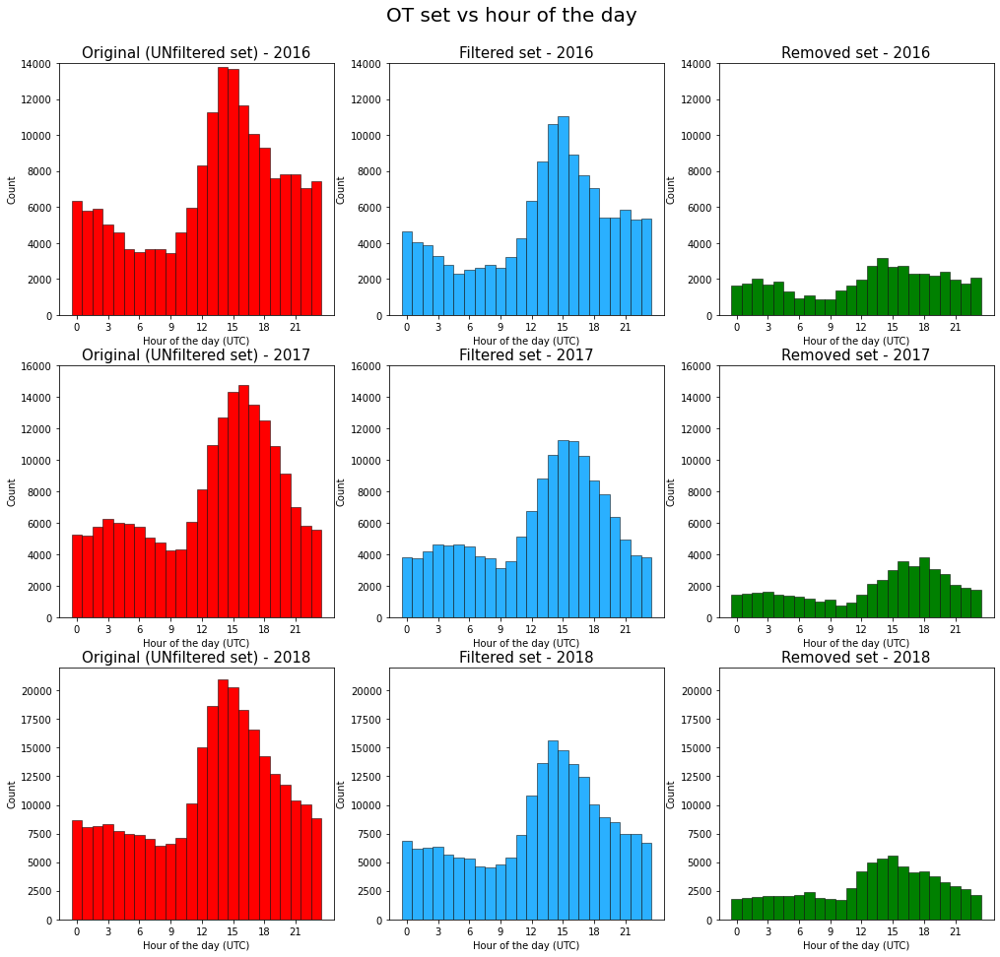

In [63]:
#Histogram of OTs distribution dep. on the hour of the day:
fig, ((ax1, ax2, ax3),(ax4, ax5, ax6),(ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(17,16))

ax1.hist(pd.to_datetime(all_OTset_2016['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(0, 24, 3))
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax1.set_title('Original (UNfiltered set) - 2016', fontsize=15);
ax1.set_ylim([0,14000])

ax2.hist(pd.to_datetime(filt_OTset_2016['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticks(np.arange(0, 24, 3))
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax2.set_title('Filtered set - 2016', fontsize=15);
ax2.set_ylim([0,14000])

ax3.hist(pd.to_datetime(remv_OTset_2016['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticks(np.arange(0, 24, 3))
ax3.set_ylabel('Count', fontsize=10)
ax3.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax3.set_title('Removed set - 2016', fontsize=15);
ax3.set_ylim([0,14000])


ax4.hist(pd.to_datetime(all_OTset_2017['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticks(np.arange(0, 24, 3))
ax4.set_ylabel('Count', fontsize=10)
ax4.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax4.set_title('Original (UNfiltered set) - 2017', fontsize=15);
ax4.set_ylim([0,16000]);

ax5.hist(pd.to_datetime(filt_OTset_2017['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax5.set_xticks(np.arange(0, 24, 3))
ax5.set_ylabel('Count', fontsize=10)
ax5.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax5.set_title('Filtered set - 2017', fontsize=15);
ax5.set_ylim([0,16000])

ax6.hist(pd.to_datetime(remv_OTset_2017['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax6.set_xticks(np.arange(0, 24, 3))
ax6.set_ylabel('Count', fontsize=10)
ax6.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax6.set_title('Removed set - 2017', fontsize=15);
ax6.set_ylim([0,16000])


ax7.hist(pd.to_datetime(all_OTset_2018['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax7.set_xticks(np.arange(0, 24, 3))
ax7.set_ylabel('Count', fontsize=10)
ax7.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax7.set_title('Original (UNfiltered set) - 2018', fontsize=15);
ax7.set_ylim([0,22000]);

ax8.hist(pd.to_datetime(filt_OTset_2018['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax8.set_xticks(np.arange(0, 24, 3))
ax8.set_ylabel('Count', fontsize=10)
ax8.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax8.set_title('Filtered set - 2018', fontsize=15);
ax8.set_ylim([0,22000])

ax9.hist(pd.to_datetime(remv_OTset_2018['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax9.set_xticks(np.arange(0, 24, 3))
ax9.set_ylabel('Count', fontsize=10)
ax9.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax9.set_title('Removed set - 2018', fontsize=15);
ax9.set_ylim([0,22000])

#fig.subplots_adjust(hspace=.5)
fig.suptitle('OT set vs hour of the day', fontsize=20, y=.93);

#pl.savefig(plt_fold + f"/hist_OTvsHour_2016-2018.pdf",dpi=200, bbox_inches='tight')

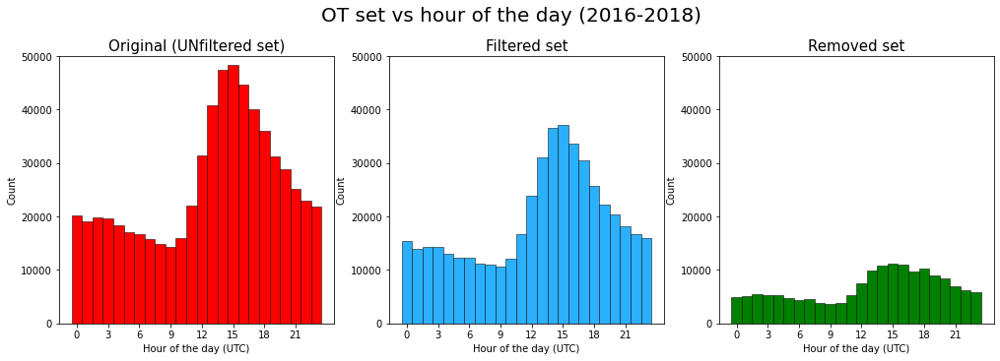

In [69]:
#Histogram of OTs distribution dep. on the hour of the day: CONCAT YEARS TOGETHER
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(17,5))

ax1.hist(pd.to_datetime(all_OTset_2016_2017_2018['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(0, 24, 3))
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax1.set_title('Original (UNfiltered set)', fontsize=15);
ax1.set_ylim([0,50000])

ax2.hist(pd.to_datetime(filt_OTset_2016_2017_2018['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticks(np.arange(0, 24, 3))
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax2.set_title('Filtered set', fontsize=15);
ax2.set_ylim([0,50000])

ax3.hist(pd.to_datetime(remv_OTset_2016_2017_2018['time']).dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticks(np.arange(0, 24, 3))
ax3.set_ylabel('Count', fontsize=10)
ax3.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax3.set_title('Removed set', fontsize=15);
ax3.set_ylim([0,50000]);

fig.suptitle('OT set vs hour of the day (2016-2018)', fontsize=20, y=1.02);

#pl.savefig(plt_fold + f"/hist_OTvsHour_2016-2018.png",dpi=200, bbox_inches='tight')

#### - Monthly basis

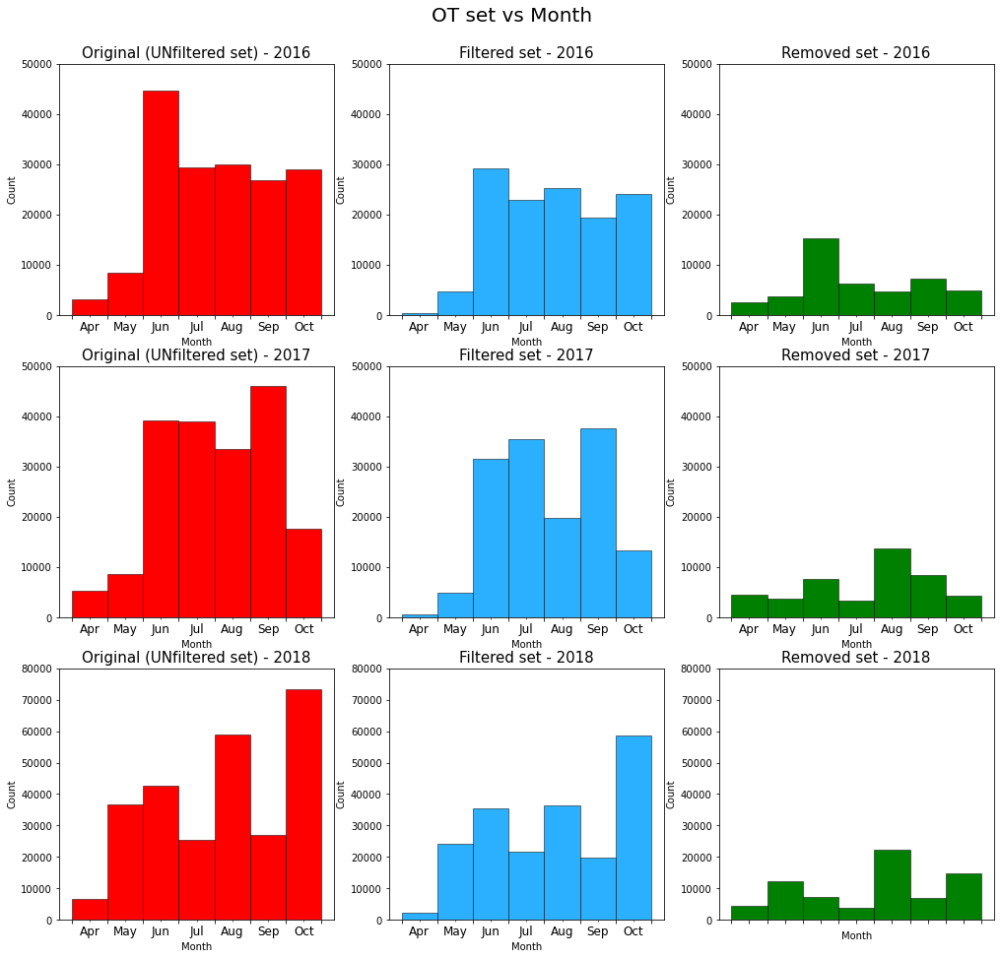

In [103]:
#Histogram of OTs distribution dep. on the MONTH:
fig, ((ax1, ax2, ax3),(ax4, ax5, ax6),(ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(17,16))

ax1.hist(pd.to_datetime(all_OTset_2016['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)
ax1.set_xticklabels('')
ax1.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Month', fontsize=10)
ax1.set_title('Original (UNfiltered set) - 2016', fontsize=15);
ax1.set_ylim([0,50000])

ax2.hist(pd.to_datetime(filt_OTset_2016['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticklabels('')
ax2.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Month', fontsize=10)
ax2.set_title('Filtered set - 2016', fontsize=15);
ax2.set_ylim([0,50000])

ax3.hist(pd.to_datetime(remv_OTset_2016['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticklabels('')
ax3.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax3.set_ylabel('Count', fontsize=10)
ax3.set_xlabel('Month', fontsize=10)
ax3.set_title('Removed set - 2016', fontsize=15);
ax3.set_ylim([0,50000])


ax4.hist(pd.to_datetime(all_OTset_2017['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticklabels('')
ax4.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax4.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax4.set_ylabel('Count', fontsize=10)
ax4.set_xlabel('Month', fontsize=10)
ax4.set_title('Original (UNfiltered set) - 2017', fontsize=15);
ax4.set_ylim([0,50000]);

ax5.hist(pd.to_datetime(filt_OTset_2017['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax5.set_xticklabels('')
ax5.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax5.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax5.set_ylabel('Count', fontsize=10)
ax5.set_xlabel('Month', fontsize=10)
ax5.set_title('Filtered set - 2017', fontsize=15);
ax5.set_ylim([0,50000])

ax6.hist(pd.to_datetime(remv_OTset_2017['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax6.set_xticklabels('')
ax6.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax6.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax6.set_ylabel('Count', fontsize=10)
ax6.set_xlabel('Month', fontsize=10)
ax6.set_title('Removed set - 2017', fontsize=15);
ax6.set_ylim([0,50000])


ax7.hist(pd.to_datetime(all_OTset_2018['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax7.set_xticklabels('')
ax7.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax7.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax7.set_ylabel('Count', fontsize=10)
ax7.set_xlabel('Month', fontsize=10)
ax7.set_title('Original (UNfiltered set) - 2018', fontsize=15);
ax7.set_ylim([0,80000]);

ax8.hist(pd.to_datetime(filt_OTset_2018['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax8.set_xticklabels('')
ax8.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax8.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax8.set_ylabel('Count', fontsize=10)
ax8.set_xlabel('Month', fontsize=10)
ax8.set_title('Filtered set - 2018', fontsize=15);
ax8.set_ylim([0,80000])

ax9.hist(pd.to_datetime(remv_OTset_2018['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax9.set_xticklabels('')
ax9.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax9.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax9.set_ylabel('Count', fontsize=10)
ax9.set_xlabel('Month', fontsize=10)
ax9.set_title('Removed set - 2018', fontsize=15);
ax9.set_ylim([0,80000])

#fig.subplots_adjust(hspace=.5)
fig.suptitle('OT set vs Month', fontsize=20, y=.93);

pl.savefig(plt_fold + f"/hist_OTvsMonth_2016-2018_sepYears.png",dpi=200, bbox_inches='tight')

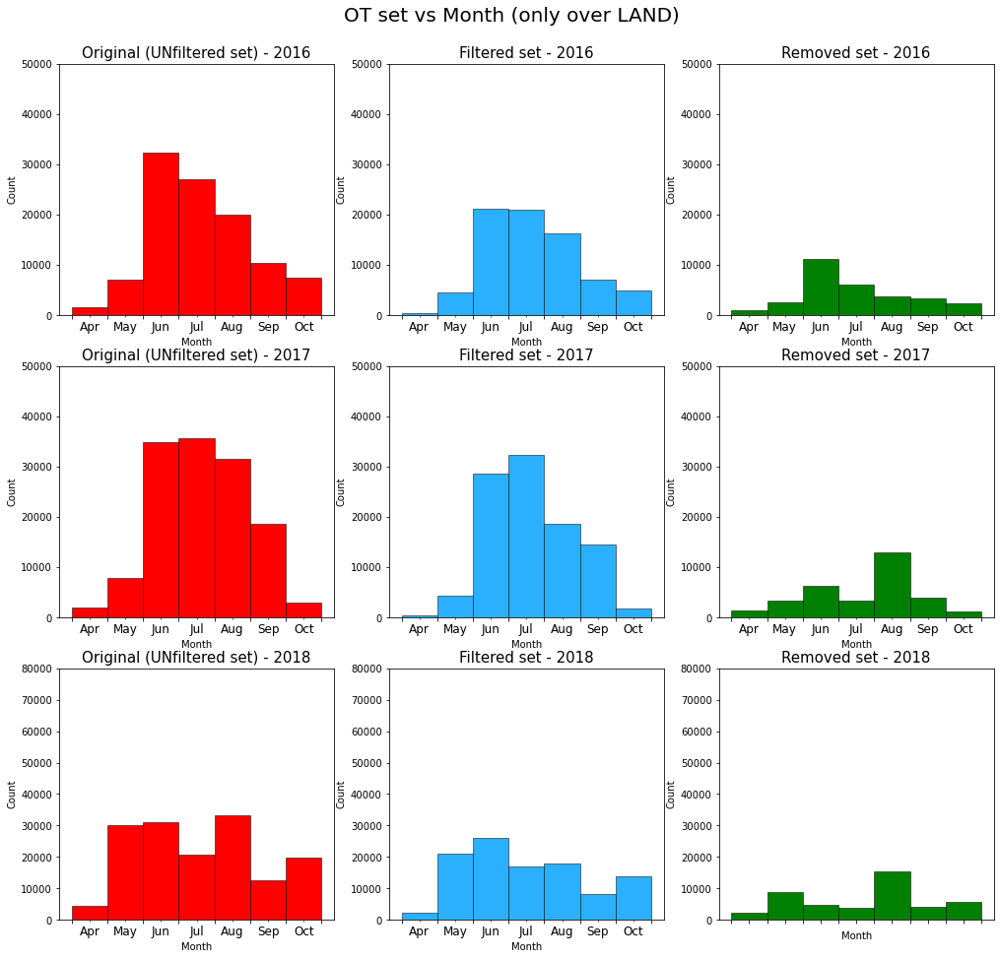

In [102]:
#Histogram of OTs distribution dep. on the MONTH only OVER LAND:
fig, ((ax1, ax2, ax3),(ax4, ax5, ax6),(ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(17,16))

ax1.hist(pd.to_datetime(all_OTset_2016_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)
ax1.set_xticklabels('')
ax1.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Month', fontsize=10)
ax1.set_title('Original (UNfiltered set) - 2016', fontsize=15);
ax1.set_ylim([0,50000])

ax2.hist(pd.to_datetime(filt_OTset_2016_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticklabels('')
ax2.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Month', fontsize=10)
ax2.set_title('Filtered set - 2016', fontsize=15);
ax2.set_ylim([0,50000])

ax3.hist(pd.to_datetime(remv_OTset_2016_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticklabels('')
ax3.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax3.set_ylabel('Count', fontsize=10)
ax3.set_xlabel('Month', fontsize=10)
ax3.set_title('Removed set - 2016', fontsize=15);
ax3.set_ylim([0,50000])


ax4.hist(pd.to_datetime(all_OTset_2017_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticklabels('')
ax4.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax4.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax4.set_ylabel('Count', fontsize=10)
ax4.set_xlabel('Month', fontsize=10)
ax4.set_title('Original (UNfiltered set) - 2017', fontsize=15);
ax4.set_ylim([0,50000]);

ax5.hist(pd.to_datetime(filt_OTset_2017_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax5.set_xticklabels('')
ax5.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax5.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax5.set_ylabel('Count', fontsize=10)
ax5.set_xlabel('Month', fontsize=10)
ax5.set_title('Filtered set - 2017', fontsize=15);
ax5.set_ylim([0,50000])

ax6.hist(pd.to_datetime(remv_OTset_2017_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax6.set_xticklabels('')
ax6.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax6.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax6.set_ylabel('Count', fontsize=10)
ax6.set_xlabel('Month', fontsize=10)
ax6.set_title('Removed set - 2017', fontsize=15);
ax6.set_ylim([0,50000])


ax7.hist(pd.to_datetime(all_OTset_2018_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax7.set_xticklabels('')
ax7.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax7.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax7.set_ylabel('Count', fontsize=10)
ax7.set_xlabel('Month', fontsize=10)
ax7.set_title('Original (UNfiltered set) - 2018', fontsize=15);
ax7.set_ylim([0,80000]);

ax8.hist(pd.to_datetime(filt_OTset_2018_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax8.set_xticklabels('')
ax8.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax8.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax8.set_ylabel('Count', fontsize=10)
ax8.set_xlabel('Month', fontsize=10)
ax8.set_title('Filtered set - 2018', fontsize=15);
ax8.set_ylim([0,80000])

ax9.hist(pd.to_datetime(remv_OTset_2018_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax9.set_xticklabels('')
ax9.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax9.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax9.set_ylabel('Count', fontsize=10)
ax9.set_xlabel('Month', fontsize=10)
ax9.set_title('Removed set - 2018', fontsize=15);
ax9.set_ylim([0,80000])

#fig.subplots_adjust(hspace=.5)
fig.suptitle('OT set vs Month (only over LAND)', fontsize=20, y=.93);

pl.savefig(plt_fold + f"/hist_OTvsMonth_2016-2018_sepYears_LAND.pdf",dpi=200, bbox_inches='tight')

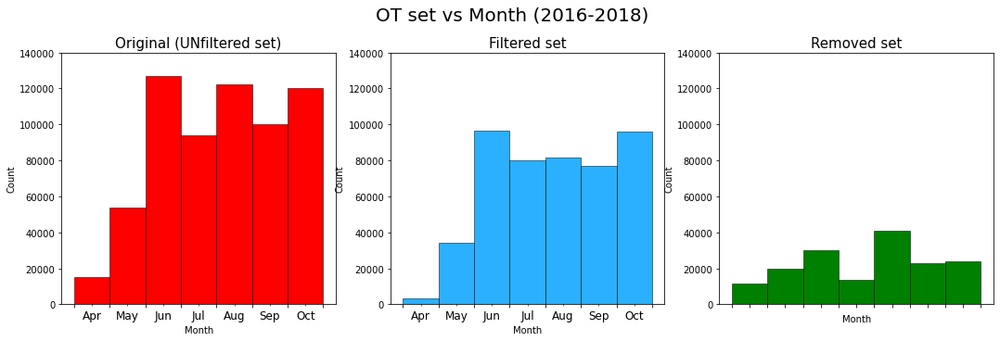

In [95]:
#Histogram of OTs distribution dep. on the MONTH:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,5))

ax1.hist(pd.to_datetime(all_OTset_2016_2017_2018['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)
ax1.set_xticklabels('')
ax1.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Month', fontsize=10)
ax1.set_title('Original (UNfiltered set)', fontsize=15);
ax1.set_ylim([0,140000])

ax2.hist(pd.to_datetime(filt_OTset_2016_2017_2018['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticklabels('')
ax2.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Month', fontsize=10)
ax2.set_title('Filtered set', fontsize=15);
ax2.set_ylim([0,140000])

ax3.hist(pd.to_datetime(remv_OTset_2016_2017_2018['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticklabels('')
ax3.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax3.set_ylabel('Count', fontsize=10)
ax3.set_xlabel('Month', fontsize=10)
ax3.set_title('Removed set', fontsize=15);
ax3.set_ylim([0,140000])

fig.suptitle('OT set vs Month (2016-2018)', fontsize=20, y=1.02);

pl.savefig(plt_fold + f"/hist_OTvsMonth_2016-2018.pdf",dpi=200, bbox_inches='tight')

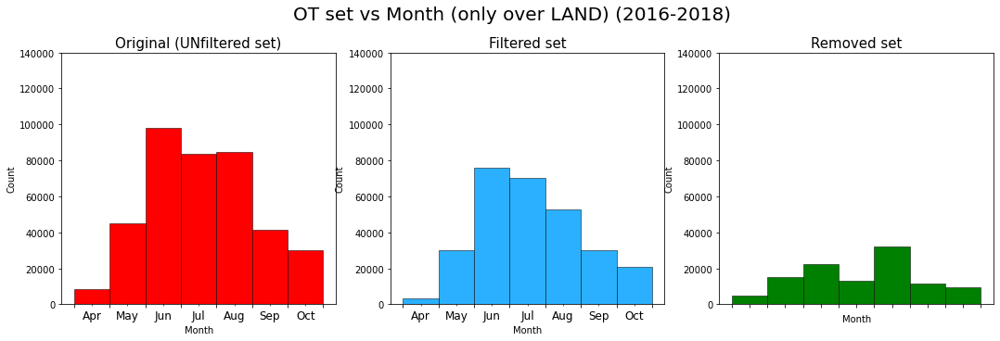

In [97]:
#Histogram of OTs distribution dep. on the MONTH only OVER LAND:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,5))

ax1.hist(pd.to_datetime(all_OTset_2016_2017_2018_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)
ax1.set_xticklabels('')
ax1.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Month', fontsize=10)
ax1.set_title('Original (UNfiltered set)', fontsize=15);
ax1.set_ylim([0,140000])

ax2.hist(pd.to_datetime(filt_OTset_2016_2017_2018_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticklabels('')
ax2.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Month', fontsize=10)
ax2.set_title('Filtered set', fontsize=15);
ax2.set_ylim([0,140000])

ax3.hist(pd.to_datetime(remv_OTset_2016_2017_2018_land['time']).dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticklabels('')
ax3.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax3.set_ylabel('Count', fontsize=10)
ax3.set_xlabel('Month', fontsize=10)
ax3.set_title('Removed set', fontsize=15);
ax3.set_ylim([0,140000])

fig.suptitle('OT set vs Month (only over LAND) (2016-2018)', fontsize=20, y=1.02);

pl.savefig(plt_fold + f"/hist_OTvsMonth_2016-2018_LAND.pdf",dpi=200, bbox_inches='tight')

#### - Spatial distributions

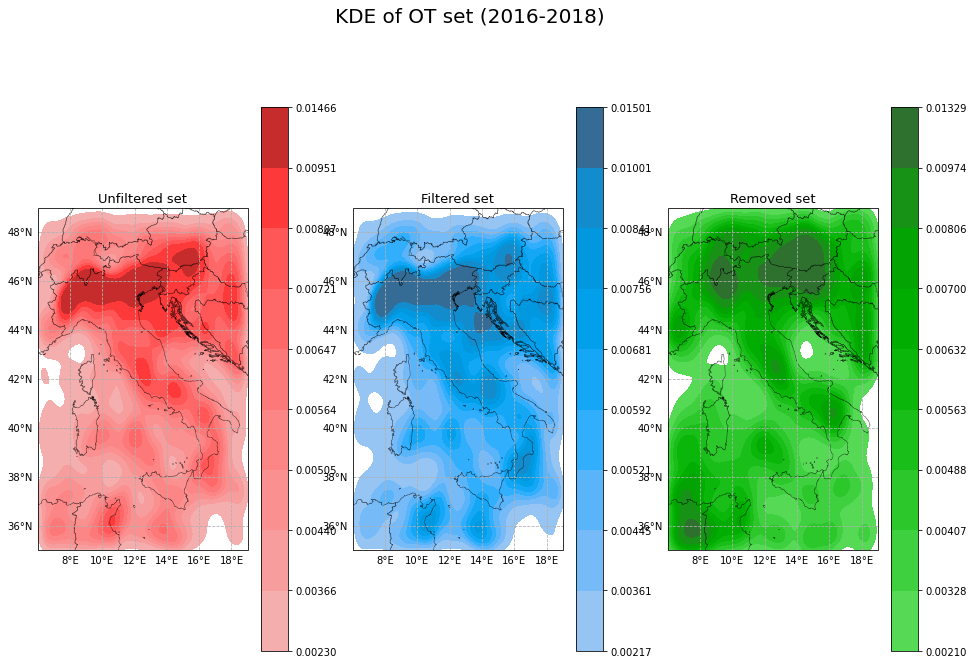

In [96]:
#KDE density functions

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,10), subplot_kw={'projection': ccrs.PlateCarree()})

sns.kdeplot(all_OTset_2016_2017_2018.lon, all_OTset_2016_2017_2018.lat, data=all_OTset_2016_2017_2018, 
            ax=ax1, shade=True, color="red", cbar=True, xlim=x_lim, ylim=y_lim)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Unfiltered set', fontsize=13);


sns.kdeplot(filt_OTset_2016_2017_2018.lon, filt_OTset_2016_2017_2018.lat, data=filt_OTset_2016_2017_2018, 
            ax=ax2, shade=True, color="#2ab0ff", cbar=True, xlim=x_lim, ylim=y_lim)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Filtered set', fontsize=13);

sns.kdeplot(remv_OTset_2016_2017_2018.lon, remv_OTset_2016_2017_2018.lat, data=remv_OTset_2016_2017_2018, 
            ax=ax3, shade=True,color="green", cbar=True, xlim=x_lim, ylim=y_lim)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('Removed set', fontsize=13);

fig.suptitle('KDE of OT set (2016-2018)', fontsize=20, y=1.02);

#pl.savefig(plt_fold + f"/KDE_OT_2016-2018.pdf",dpi=200, bbox_inches='tight')

#### - Spatial join (i.e. count number of OTs in a cell) between the points and the grid (for the moment 10km grid SPHERA used) to count  Number of OTs in grid

In [16]:
#Read SPHERA data (10km grid) and couple box number to coordinate locations:
sfg_sp = gpd.read_file(fold + "data/lampinet/mask/grid_10_49N.shp", encoding='latin-1')

In [17]:
#add columns of 1s to be summed in the spatial join with grid:
all_OTset_2016_2017_2018['N_OT'] = 1
filt_OTset_2016_2017_2018['N_OT'] = 1
remv_OTset_2016_2017_2018['N_OT'] = 1

points_allOT = all_OTset_2016_2017_2018
points_filtOT = filt_OTset_2016_2017_2018
points_remvOT = remv_OTset_2016_2017_2018
grid = sfg_sp

#spatial join between points and grid
pointInPolys_allOT = sjoin(points_allOT, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT = sjoin(points_filtOT, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_remvOT = sjoin(points_remvOT, grid, how='left').drop(['index_right'],axis=1)

#sum points in each grid cell
pointSumByPoly_allOT = pointInPolys_allOT.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT = pointInPolys_filtOT.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT = pointInPolys_remvOT.groupby('FID')['N_OT'].agg(['sum'])

#create grid with associated number of OTs for each grid:
allOT_countOnGrid = sfg_sp.copy()
filtOT_countOnGrid = sfg_sp.copy()
remvOT_countOnGrid = sfg_sp.copy()

allOT_countOnGrid['N_OT'] = pointSumByPoly_allOT['sum']
filtOT_countOnGrid['N_OT'] = pointSumByPoly_filtOT['sum']
remvOT_countOnGrid['N_OT'] = pointSumByPoly_remvOT['sum']

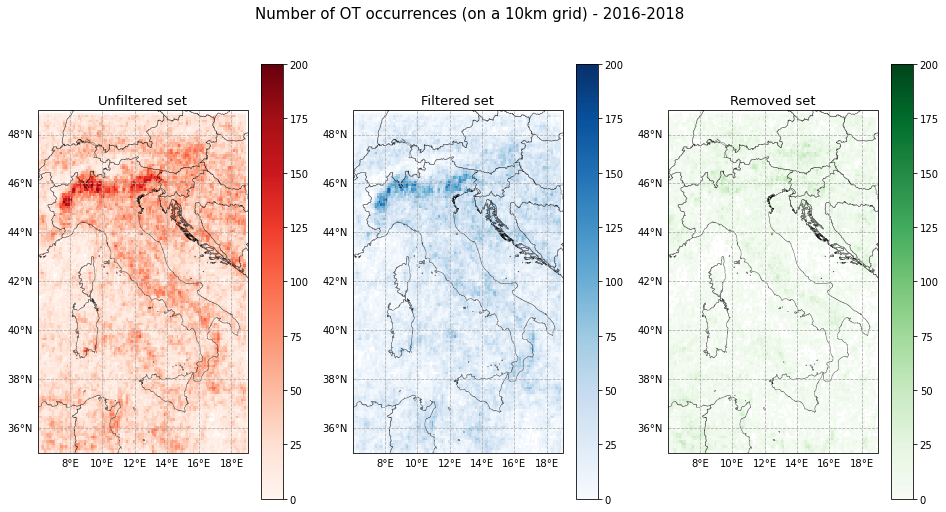

In [20]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid.plot(column='N_OT', ax=ax1, cmap='Reds', kind='geo', vmin=0, vmax=200, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Unfiltered set', fontsize=13);

filtOT_countOnGrid.plot(column='N_OT', ax=ax2, cmap='Blues', kind='geo', vmin=0, vmax=200, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Filtered set', fontsize=13);

remvOT_countOnGrid.plot(column='N_OT', ax=ax3, cmap='Greens', kind='geo',  vmin=0, vmax=200, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('Removed set', fontsize=13);

fig.suptitle('Number of OT occurrences (on a 10km grid) - 2016-2018', fontsize=15);

#pl.savefig(plt_fold + f"/N_OTs_10km_2016-2018.pdf",dpi=200, bbox_inches='tight')

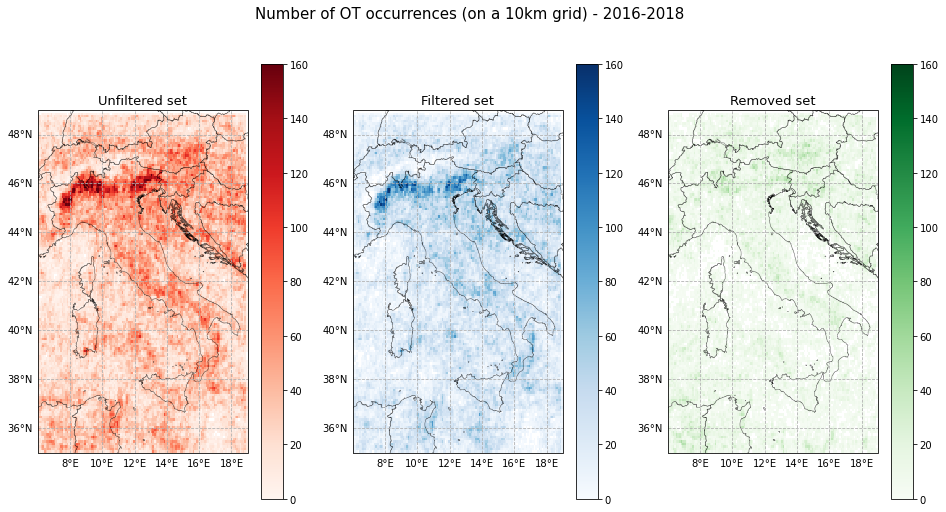

In [36]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid.plot(column='N_OT', ax=ax1, cmap='Reds', kind='geo', vmin=0, vmax=160, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Unfiltered set', fontsize=13);

filtOT_countOnGrid.plot(column='N_OT', ax=ax2, cmap='Blues', kind='geo', vmin=0, vmax=160, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Filtered set', fontsize=13);

remvOT_countOnGrid.plot(column='N_OT', ax=ax3, cmap='Greens', kind='geo',  vmin=0, vmax=160, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('Removed set', fontsize=13);

fig.suptitle('Number of OT occurrences (on a 10km grid) - 2016-2018', fontsize=15);

pl.savefig(plt_fold + f"/N_OTs_10km_2016-2018_v2.svg",dpi=100, bbox_inches='tight')

### Percentage plot (took from 7-OTfilt_full_vs_singleParam_comparison.ipynb)

In [40]:
#set all NaNs in filtOT_countOnGrid to 0 to consider occasions when all OTs (100%) have been filtered out:
filtOT_countOnGrid['N_OT'] = filtOT_countOnGrid['N_OT'].replace(np.nan, 1)

In [64]:
perc_filtOT_countOnGrid = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid['FID'] = allOT_countOnGrid['FID']
perc_filtOT_countOnGrid['geometry'] = allOT_countOnGrid['geometry']

perc_filtOT_countOnGrid['perc_OT'] = 1 - (filtOT_countOnGrid['N_OT']/allOT_countOnGrid['N_OT'])

In [65]:
perc_filtOT_countOnGrid

,FID,geometry,perc_OT
0,0,"POLYGON ((6.00000 35.00000, 6.00000 35.10000, ...",0.800000
1,1,"POLYGON ((6.10000 35.00000, 6.10000 35.10000, ...",0.428571
2,2,"POLYGON ((6.20000 35.00000, 6.20000 35.10000, ...",0.500000
3,3,"POLYGON ((6.30000 35.00000, 6.30000 35.10000, ...",NaN
4,4,"POLYGON ((6.40000 35.00000, 6.40000 35.10000, ...",0.596154
...,...,...,...
18195,18195,"POLYGON ((18.50000 48.90000, 18.50000 49.00000...",NaN
18196,18196,"POLYGON ((18.60000 48.90000, 18.60000 49.00000...",NaN
18197,18197,"POLYGON ((18.70000 48.90000, 18.70000 49.00000...",NaN
18198,18198,"POLYGON ((18.80000 48.90000, 18.80000 49.00000...",NaN


In [49]:
filtOT_countOnGrid[filtOT_countOnGrid['N_OT'] == np.nan]

,FID,geometry,N_OT


In [58]:
filtOT_countOnGrid[filtOT_countOnGrid['N_OT'].isnull() == True]

,FID,geometry,N_OT
3,3,"POLYGON ((6.30000 35.00000, 6.30000 35.10000, ...",NaN
12,12,"POLYGON ((7.20000 35.00000, 7.20000 35.10000, ...",NaN
111,111,"POLYGON ((17.10000 35.00000, 17.10000 35.10000...",NaN
112,112,"POLYGON ((17.20000 35.00000, 17.20000 35.10000...",NaN
113,113,"POLYGON ((17.30000 35.00000, 17.30000 35.10000...",NaN
...,...,...,...
18195,18195,"POLYGON ((18.50000 48.90000, 18.50000 49.00000...",NaN
18196,18196,"POLYGON ((18.60000 48.90000, 18.60000 49.00000...",NaN
18197,18197,"POLYGON ((18.70000 48.90000, 18.70000 49.00000...",NaN
18198,18198,"POLYGON ((18.80000 48.90000, 18.80000 49.00000...",NaN


In [59]:
allOT_countOnGrid[allOT_countOnGrid['N_OT'].isnull() == True]

,FID,geometry,N_OT
895,895,"POLYGON ((17.50000 35.60000, 17.50000 35.70000...",NaN
1019,1019,"POLYGON ((16.90000 35.70000, 16.90000 35.80000...",NaN
1021,1021,"POLYGON ((17.10000 35.70000, 17.10000 35.80000...",NaN
1022,1022,"POLYGON ((17.20000 35.70000, 17.20000 35.80000...",NaN
1150,1150,"POLYGON ((17.00000 35.80000, 17.00000 35.90000...",NaN
...,...,...,...
18195,18195,"POLYGON ((18.50000 48.90000, 18.50000 49.00000...",NaN
18196,18196,"POLYGON ((18.60000 48.90000, 18.60000 49.00000...",NaN
18197,18197,"POLYGON ((18.70000 48.90000, 18.70000 49.00000...",NaN
18198,18198,"POLYGON ((18.80000 48.90000, 18.80000 49.00000...",NaN


(35.0, 49.0)

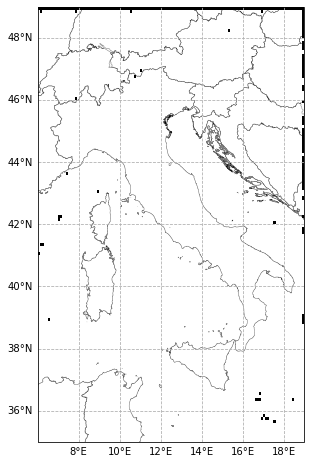

In [60]:
fig, ax1 = plt.subplots(1, 1, figsize=(8,8), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid[allOT_countOnGrid['N_OT'].isnull() == True].plot(column='N_OT', ax=ax1, color='black',
                                                                   kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)


(35.0, 49.0)

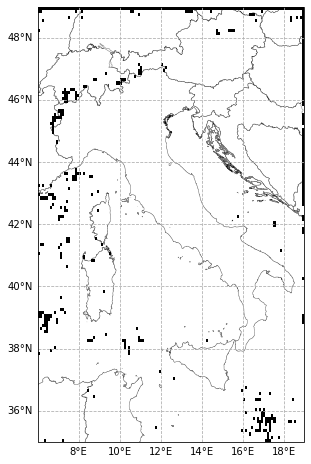

In [61]:
fig, ax1 = plt.subplots(1, 1, figsize=(8,8), subplot_kw={'projection': ccrs.PlateCarree()})

filtOT_countOnGrid[filtOT_countOnGrid['N_OT'].isnull() == True].plot(column='N_OT', ax=ax1, color='black',
                                                                   kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)

## - LAND/SEA daily cycle of  OTs (filtered/unfiltered)

In [16]:
#Extract SEA OTs only:
all_OTset_2016_sea = all_OTset_2016.drop(index=all_OTset_2016_land.index)
all_OTset_2017_sea = all_OTset_2017.drop(index=all_OTset_2017_land.index)
all_OTset_2018_sea = all_OTset_2018.drop(index=all_OTset_2018_land.index)

filt_OTset_2016_sea = filt_OTset_2016.drop(index=filt_OTset_2016_land.index)
filt_OTset_2017_sea = filt_OTset_2017.drop(index=filt_OTset_2017_land.index)
filt_OTset_2018_sea = filt_OTset_2018.drop(index=filt_OTset_2018_land.index)

#concat together:
all_OTset_2016_2017_2018_sea = pd.concat([all_OTset_2016_sea, all_OTset_2017_sea, all_OTset_2018_sea])
filt_OTset_2016_2017_2018_sea = pd.concat([filt_OTset_2016_sea, filt_OTset_2017_sea, filt_OTset_2018_sea])


#convert time columns object to datetime objects of all datasets:
all_OTset_2016_2017_2018['time'] = pd.to_datetime(all_OTset_2016_2017_2018['time'])
filt_OTset_2016_2017_2018['time'] = pd.to_datetime(filt_OTset_2016_2017_2018['time'])

all_OTset_2016_2017_2018_land['time'] = pd.to_datetime(all_OTset_2016_2017_2018_land['time'])
filt_OTset_2016_2017_2018_land['time'] = pd.to_datetime(filt_OTset_2016_2017_2018_land['time'])

all_OTset_2016_2017_2018_sea['time'] = pd.to_datetime(all_OTset_2016_2017_2018_sea['time'])
filt_OTset_2016_2017_2018_sea['time'] = pd.to_datetime(filt_OTset_2016_2017_2018_sea['time'])

#add new column of number of OTs to find out the distribution of OTs differentiating by land/sea:
all_OTset_2016_2017_2018['N_OT'] = 1
filt_OTset_2016_2017_2018['N_OT'] = 1

all_OTset_2016_2017_2018_land['N_OT'] = 1
filt_OTset_2016_2017_2018_land['N_OT'] = 1

all_OTset_2016_2017_2018_sea['N_OT'] = 1
filt_OTset_2016_2017_2018_sea['N_OT'] = 1

In [64]:
#sum the hourly number of OTs for each dataset:
hsum_all_OTs_2016_2017_2018 = all_OTset_2016_2017_2018.groupby(by=all_OTset_2016_2017_2018.time.dt.hour).N_OT.sum()
hsum_all_OTs_2016_2017_2018_land = all_OTset_2016_2017_2018_land.groupby(by=all_OTset_2016_2017_2018_land.time.dt.hour).N_OT.sum()
hsum_all_OTs_2016_2017_2018_sea = all_OTset_2016_2017_2018_sea.groupby(by=all_OTset_2016_2017_2018_sea.time.dt.hour).N_OT.sum()

hsum_filt_OTs_2016_2017_2018 = filt_OTset_2016_2017_2018.groupby(by=filt_OTset_2016_2017_2018.time.dt.hour).N_OT.sum()
hsum_filt_OTs_2016_2017_2018_land = filt_OTset_2016_2017_2018_land.groupby(by=filt_OTset_2016_2017_2018_land.time.dt.hour).N_OT.sum()
hsum_filt_OTs_2016_2017_2018_sea = filt_OTset_2016_2017_2018_sea.groupby(by=filt_OTset_2016_2017_2018_sea.time.dt.hour).N_OT.sum()

In [94]:
#calculate the hourly fraction of land/sea OTs:

#All OTs dataset
#HOURLY FRACTION OVER THE HOUR
land_hhfrac_all_OTs_2016_2017_2018 = hsum_all_OTs_2016_2017_2018_land/hsum_all_OTs_2016_2017_2018
sea_hhfrac_all_OTs_2016_2017_2018 = hsum_all_OTs_2016_2017_2018_sea/hsum_all_OTs_2016_2017_2018
#HOURLY FRACTION OVER THE WHOLE DAY:
land_dhfrac_all_OTs_2016_2017_2018 = hsum_all_OTs_2016_2017_2018_land/sum(hsum_all_OTs_2016_2017_2018)
sea_dhfrac_all_OTs_2016_2017_2018 = hsum_all_OTs_2016_2017_2018_sea/sum(hsum_all_OTs_2016_2017_2018)

#Filt OTs dataset
#HOURLY FRACTION OVER THE HOUR
land_hhfrac_filt_OTs_2016_2017_2018 = hsum_filt_OTs_2016_2017_2018_land/hsum_filt_OTs_2016_2017_2018
sea_hhfrac_filt_OTs_2016_2017_2018 = hsum_filt_OTs_2016_2017_2018_sea/hsum_filt_OTs_2016_2017_2018
#HOURLY FRACTION OVER THE WHOLE DAY:
land_dhfrac_filt_OTs_2016_2017_2018 = hsum_filt_OTs_2016_2017_2018_land/sum(hsum_filt_OTs_2016_2017_2018)
sea_dhfrac_filt_OTs_2016_2017_2018 = hsum_filt_OTs_2016_2017_2018_sea/sum(hsum_filt_OTs_2016_2017_2018)

In [97]:
land_hhfrac_all_OTs_2016_2017_2018

time
0     0.414680
1     0.384882
2     0.370870
3     0.336384
4     0.335629
5     0.338024
6     0.347426
7     0.343847
8     0.349824
9     0.373609
10    0.495147
11    0.635648
12    0.732827
13    0.785190
14    0.806991
15    0.822800
16    0.810389
17    0.792776
18    0.748821
19    0.706126
20    0.657927
21    0.607585
22    0.533624
23    0.449665
Name: N_OT, dtype: float64

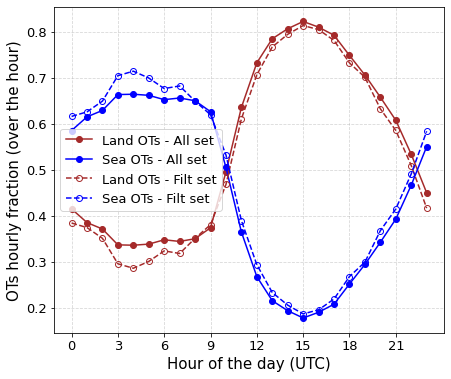

In [119]:
fig, ax = plt.subplots(figsize = (7,6))

ax.plot(land_hhfrac_all_OTs_2016_2017_2018, marker='o', color='brown', label='Land OTs - All set')
ax.plot(sea_hhfrac_all_OTs_2016_2017_2018, marker='o', color='blue', label='Sea OTs - All set')

ax.plot(land_hhfrac_filt_OTs_2016_2017_2018, marker='o', fillstyle='none',
        ls ='--', color='brown', label='Land OTs - Filt set')
ax.plot(sea_hhfrac_filt_OTs_2016_2017_2018, marker='o', fillstyle='none',
        ls ='--', color='blue', label='Sea OTs - Filt set')

ax.set_xticks(np.arange(0, 24, 3))
ax.set_xlabel('Hour of the day (UTC)', fontsize=15)
ax.set_ylabel('OTs hourly fraction (over the hour)', fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=13)
plt.grid(ls='--', alpha=0.5)
plt.legend(loc='best', fontsize=13)

pl.savefig(plt_fold + f"/land-sea_OTs_filt-nonfilt_hh.png",dpi=100, bbox_inches='tight')

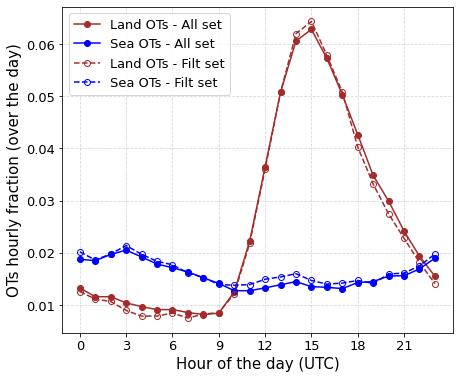

In [121]:
fig, ax = plt.subplots(figsize = (7,6))

ax.plot(land_dhfrac_all_OTs_2016_2017_2018, marker='o', color='brown', label='Land OTs - All set')
ax.plot(sea_dhfrac_all_OTs_2016_2017_2018, marker='o', color='blue', label='Sea OTs - All set')

ax.plot(land_dhfrac_filt_OTs_2016_2017_2018, marker='o', fillstyle='none', 
        ls ='--', color='brown', label='Land OTs - Filt set')
ax.plot(sea_dhfrac_filt_OTs_2016_2017_2018, marker='o', fillstyle='none',
        ls ='--', color='blue', label='Sea OTs - Filt set')

ax.set_xticks(np.arange(0, 24, 3))
ax.set_xlabel('Hour of the day (UTC)', fontsize=15)
ax.set_ylabel('OTs hourly fraction (over the day)', fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=13)
plt.grid(ls='--', alpha=0.5)
plt.legend(loc='best', fontsize=13)

pl.savefig(plt_fold + f"/land-sea_OTs_filt-nonfilt_dh.pdf",dpi=100, bbox_inches='tight')

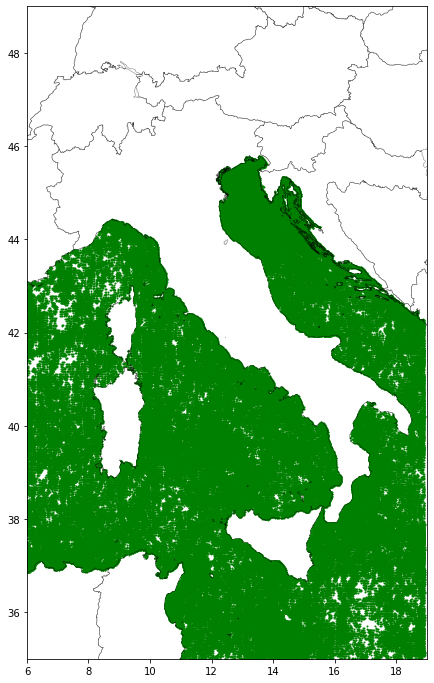

In [124]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs
all_OTset_2016_2017_2018_sea.plot(ax=ax, markersize=1, column='otpmax', color='green')   

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

In [128]:
#add columns of 1s to be summed in the spatial join with grid:
points_allOT_sea = all_OTset_2016_2017_2018_sea
points_filtOT_sea = filt_OTset_2016_2017_2018_sea

points_allOT_land = all_OTset_2016_2017_2018_land
points_filtOT_land = filt_OTset_2016_2017_2018_land

grid = sfg_sp

#spatial join between points and grid
pointInPolys_allOT_sea = sjoin(points_allOT_sea, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_sea = sjoin(points_filtOT_sea, grid, how='left').drop(['index_right'],axis=1)

pointInPolys_allOT_land = sjoin(points_allOT_land, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_land = sjoin(points_filtOT_land, grid, how='left').drop(['index_right'],axis=1)


#sum points in each grid cell
pointSumByPoly_allOT_sea = pointInPolys_allOT_sea.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_sea = pointInPolys_filtOT_sea.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_allOT_land = pointInPolys_allOT_land.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_land = pointInPolys_filtOT_land.groupby('FID')['N_OT'].agg(['sum'])

#create grid with associated number of OTs for each grid:
allOT_countOnGrid_sea = sfg_sp.copy()
filtOT_countOnGrid_sea = sfg_sp.copy()
allOT_countOnGrid_land = sfg_sp.copy()
filtOT_countOnGrid_land = sfg_sp.copy()

allOT_countOnGrid_sea['N_OT'] = pointSumByPoly_allOT_sea['sum']
filtOT_countOnGrid_sea['N_OT'] = pointSumByPoly_filtOT_sea['sum']

allOT_countOnGrid_land['N_OT'] = pointSumByPoly_allOT_land['sum']
filtOT_countOnGrid_land['N_OT'] = pointSumByPoly_filtOT_land['sum']

In [145]:
#set all NaNs in filtOT_countOnGrid to 0 to consider occasions when all OTs (100%) have been filtered out:
filtOT_countOnGrid_sea['N_OT'] = filtOT_countOnGrid_sea['N_OT'].replace(np.nan, 0)
filtOT_countOnGrid_land['N_OT'] = filtOT_countOnGrid_land['N_OT'].replace(np.nan, 0)

In [150]:
perc_filtOT_countOnGrid_land = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_sea = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])

perc_filtOT_countOnGrid_land['FID'] = allOT_countOnGrid_land['FID']
perc_filtOT_countOnGrid_land['geometry'] = allOT_countOnGrid_land['geometry']

perc_filtOT_countOnGrid_sea['FID'] = allOT_countOnGrid_sea['FID']
perc_filtOT_countOnGrid_sea['geometry'] = allOT_countOnGrid_sea['geometry']

perc_filtOT_countOnGrid_land['perc_OT'] = 1 - (filtOT_countOnGrid_land['N_OT']/allOT_countOnGrid_land['N_OT'])
perc_filtOT_countOnGrid_sea['perc_OT'] = 1 - (filtOT_countOnGrid_sea['N_OT']/allOT_countOnGrid_sea['N_OT'])

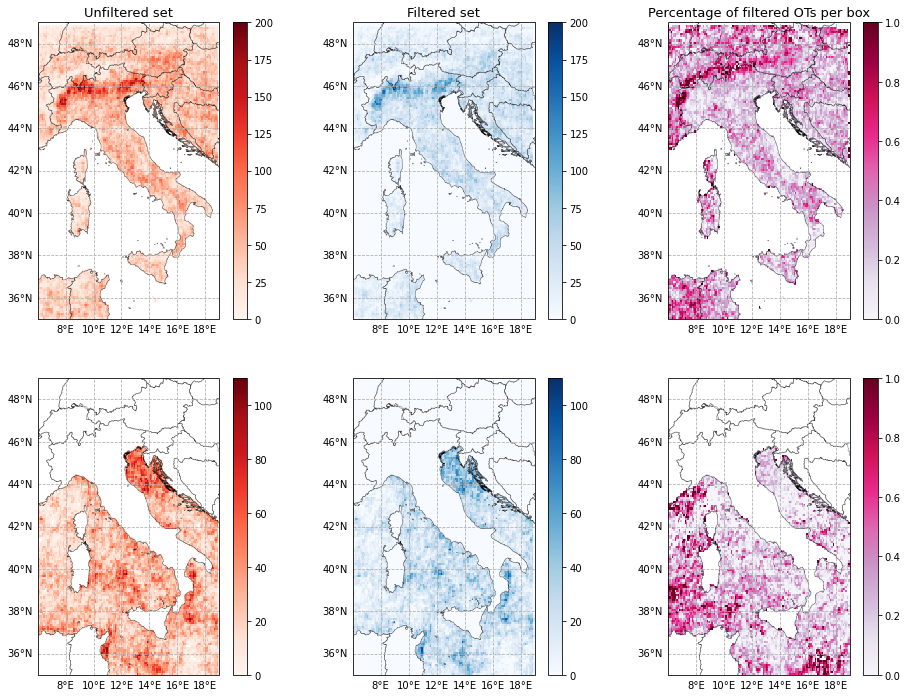

In [155]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(16,12), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid_land.plot(column='N_OT', ax=ax1, cmap='Reds', kind='geo', vmin=0, vmax=200, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Unfiltered set', fontsize=13);

filtOT_countOnGrid_land.plot(column='N_OT', ax=ax2, cmap='Blues', kind='geo', vmin=0, vmax=200, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Filtered set', fontsize=13);

perc_filtOT_countOnGrid_land.plot(column='perc_OT', ax=ax3, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('Percentage of filtered OTs per box', fontsize=13);



allOT_countOnGrid_sea.plot(column='N_OT', ax=ax4, cmap='Reds', kind='geo',  vmin=0, vmax=110, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
#ax3.set_title('Removed set', fontsize=13);

filtOT_countOnGrid_sea.plot(column='N_OT', ax=ax5, cmap='Blues', kind='geo',  vmin=0, vmax=110, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
#ax3.set_title('Removed set', fontsize=13);

perc_filtOT_countOnGrid_sea.plot(column='perc_OT', ax=ax6, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax6, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax6.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax6.set_xlim(x_lim)
ax6.set_ylim(y_lim)
#ax1.set_title('Percentage of filtered OTs per box', fontsize=13);

#fig.suptitle('Number of OT occurrences (on a 10km grid) - 2016-2018', fontsize=15);

pl.savefig(plt_fold + f"/N_OTs_10km_2016-2018_land-sea.pdf",dpi=100, bbox_inches='tight')

## - Daytime/Nighttime separation:

In [165]:
day_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[(all_OTset_2016_2017_2018['time'].dt.hour >= 8) &
                                                       (all_OTset_2016_2017_2018['time'].dt.hour < 20)]
night_all_OTset_2016_2017_2018 = pd.concat([all_OTset_2016_2017_2018[(all_OTset_2016_2017_2018['time'].dt.hour < 8)],
                                           all_OTset_2016_2017_2018[(all_OTset_2016_2017_2018['time'].dt.hour >=20)]])

day_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[(filt_OTset_2016_2017_2018['time'].dt.hour >= 8) &
                                                       (filt_OTset_2016_2017_2018['time'].dt.hour < 20)]
night_filt_OTset_2016_2017_2018 = pd.concat([filt_OTset_2016_2017_2018[(filt_OTset_2016_2017_2018['time'].dt.hour < 8)],
                                           filt_OTset_2016_2017_2018[(filt_OTset_2016_2017_2018['time'].dt.hour >=20)]])

In [167]:
#Calculate N OTs on 10km grid per month:
grid = sfg_sp

points_allOT_day = day_all_OTset_2016_2017_2018
points_allOT_night = night_all_OTset_2016_2017_2018

points_filtOT_day = day_filt_OTset_2016_2017_2018
points_filtOT_night = night_filt_OTset_2016_2017_2018

#spatial join between points and grid
pointInPolys_allOT_day = sjoin(points_allOT_day, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_allOT_night = sjoin(points_allOT_night, grid, how='left').drop(['index_right'],axis=1)

pointInPolys_filtOT_day = sjoin(points_filtOT_day, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_night = sjoin(points_filtOT_night, grid, how='left').drop(['index_right'],axis=1)

#sum points in each grid cell
pointSumByPoly_allOT_day = pointInPolys_allOT_day.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_night = pointInPolys_allOT_night.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_filtOT_day = pointInPolys_filtOT_day.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_night = pointInPolys_filtOT_night.groupby('FID')['N_OT'].agg(['sum'])

#create grid with associated number of OTs for each grid:
allOT_countOnGrid_day = sfg_sp.copy()
allOT_countOnGrid_night= sfg_sp.copy()

filtOT_countOnGrid_day = sfg_sp.copy()
filtOT_countOnGrid_night = sfg_sp.copy()

allOT_countOnGrid_day['N_OT'] = pointSumByPoly_allOT_day['sum']
allOT_countOnGrid_night['N_OT'] = pointSumByPoly_allOT_night['sum']

filtOT_countOnGrid_day['N_OT'] = pointSumByPoly_filtOT_day['sum']
filtOT_countOnGrid_night['N_OT'] = pointSumByPoly_filtOT_night['sum']

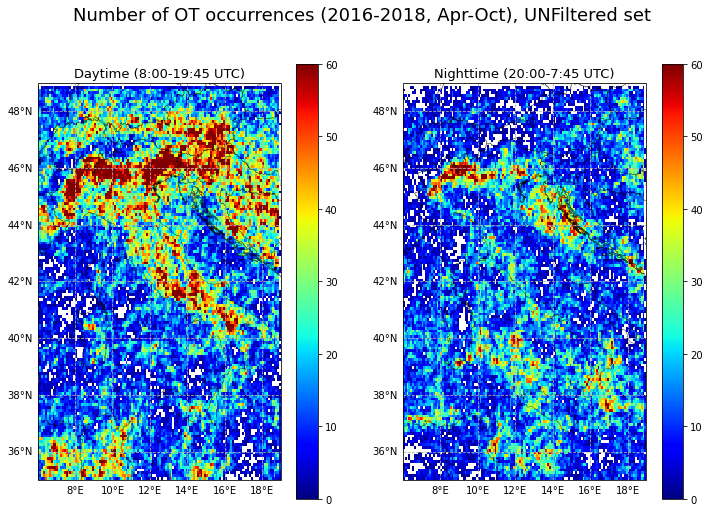

In [182]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12,8), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid_day.plot(column='N_OT', ax=ax1, cmap='jet', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Daytime (8:00-19:45 UTC)', fontsize=13);

allOT_countOnGrid_night.plot(column='N_OT', ax=ax2, cmap='jet', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Nighttime (20:00-7:45 UTC)', fontsize=13);

fig.suptitle('Number of OT occurrences (2016-2018, Apr-Oct), UNFiltered set', fontsize=18);

pl.savefig(plt_fold + f"/DayNight_N_OTs_unfilt_2016-2018.pdf",dpi=100, bbox_inches='tight')

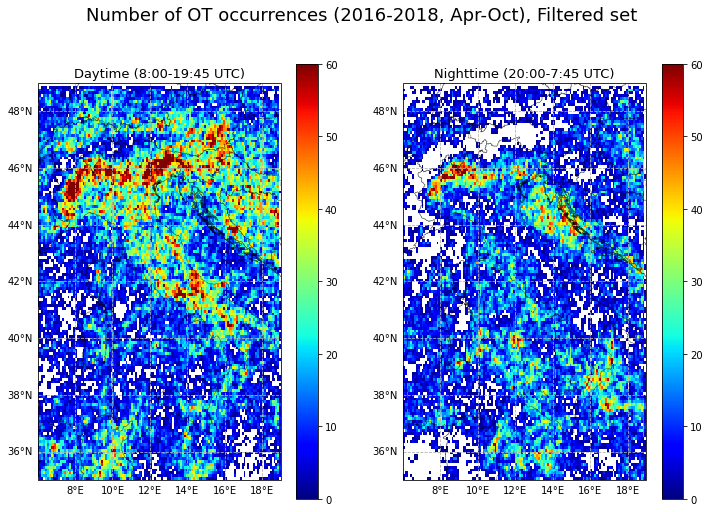

In [184]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12,8), subplot_kw={'projection': ccrs.PlateCarree()})

filtOT_countOnGrid_day.plot(column='N_OT', ax=ax1, cmap='jet', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Daytime (8:00-19:45 UTC)', fontsize=13);

filtOT_countOnGrid_night.plot(column='N_OT', ax=ax2, cmap='jet', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Nighttime (20:00-7:45 UTC)', fontsize=13);

fig.suptitle('Number of OT occurrences (2016-2018, Apr-Oct), Filtered set', fontsize=18);

pl.savefig(plt_fold + f"/DayNight_N_OTs_filt_2016-2018.png",dpi=100, bbox_inches='tight')

## - Intraannual (monthly) variability of spatial distributions of OTs:

In [59]:
remv_OTset_2016_2017_2018.time = pd.to_datetime(remv_OTset_2016_2017_2018.time)
filt_OTset_2016_2017_2018.time = pd.to_datetime(filt_OTset_2016_2017_2018.time)

In [60]:
#separate the aggregated datasets over the years in months
Apr_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[all_OTset_2016_2017_2018['time'].dt.month == 4]
May_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[all_OTset_2016_2017_2018['time'].dt.month == 5]
Jun_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[all_OTset_2016_2017_2018['time'].dt.month == 6]
Jul_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[all_OTset_2016_2017_2018['time'].dt.month == 7]
Aug_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[all_OTset_2016_2017_2018['time'].dt.month == 8]
Sep_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[all_OTset_2016_2017_2018['time'].dt.month == 9]
Oct_all_OTset_2016_2017_2018 = all_OTset_2016_2017_2018[all_OTset_2016_2017_2018['time'].dt.month == 10]

Apr_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[filt_OTset_2016_2017_2018['time'].dt.month == 4]
May_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[filt_OTset_2016_2017_2018['time'].dt.month == 5]
Jun_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[filt_OTset_2016_2017_2018['time'].dt.month == 6]
Jul_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[filt_OTset_2016_2017_2018['time'].dt.month == 7]
Aug_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[filt_OTset_2016_2017_2018['time'].dt.month == 8]
Sep_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[filt_OTset_2016_2017_2018['time'].dt.month == 9]
Oct_filt_OTset_2016_2017_2018 = filt_OTset_2016_2017_2018[filt_OTset_2016_2017_2018['time'].dt.month == 10]

Apr_remv_OTset_2016_2017_2018 = remv_OTset_2016_2017_2018[remv_OTset_2016_2017_2018['time'].dt.month == 4]
May_remv_OTset_2016_2017_2018 = remv_OTset_2016_2017_2018[remv_OTset_2016_2017_2018['time'].dt.month == 5]
Jun_remv_OTset_2016_2017_2018 = remv_OTset_2016_2017_2018[remv_OTset_2016_2017_2018['time'].dt.month == 6]
Jul_remv_OTset_2016_2017_2018 = remv_OTset_2016_2017_2018[remv_OTset_2016_2017_2018['time'].dt.month == 7]
Aug_remv_OTset_2016_2017_2018 = remv_OTset_2016_2017_2018[remv_OTset_2016_2017_2018['time'].dt.month == 8]
Sep_remv_OTset_2016_2017_2018 = remv_OTset_2016_2017_2018[remv_OTset_2016_2017_2018['time'].dt.month == 9]
Oct_remv_OTset_2016_2017_2018 = remv_OTset_2016_2017_2018[remv_OTset_2016_2017_2018['time'].dt.month == 10]

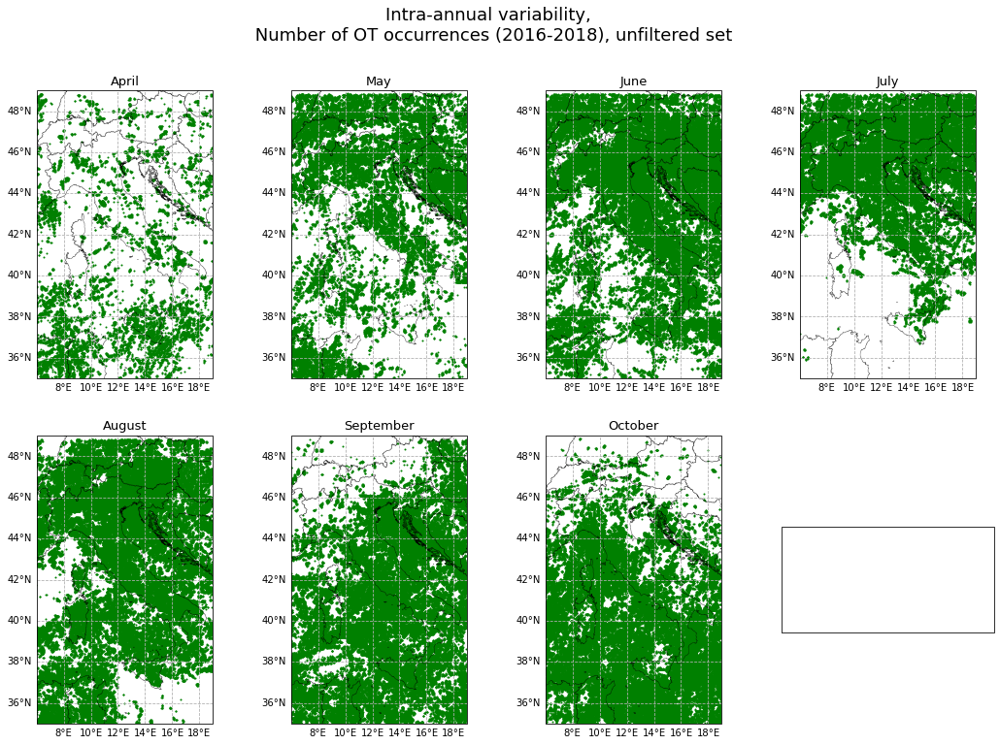

In [61]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(18,12), 
                                                                 subplot_kw={'projection': ccrs.PlateCarree()})

Apr_all_OTset_2016_2017_2018.plot(ax=ax1, markersize=1, column='otpmax', color='green')   
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('April', fontsize=13);

May_all_OTset_2016_2017_2018.plot(ax=ax2, markersize=1, column='otpmax', color='green')   
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('May', fontsize=13);

Jun_all_OTset_2016_2017_2018.plot(ax=ax3, markersize=1, column='otpmax', color='green')   
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('June', fontsize=13);

Jul_all_OTset_2016_2017_2018.plot(ax=ax4, markersize=1, column='otpmax', color='green')   
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('July', fontsize=13);

Aug_all_OTset_2016_2017_2018.plot(ax=ax5, markersize=1, column='otpmax', color='green')   
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('August', fontsize=13);

Sep_all_OTset_2016_2017_2018.plot(ax=ax6, markersize=1, column='otpmax', color='green')   
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax6, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax6.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax6.set_xlim(x_lim)
ax6.set_ylim(y_lim)
ax6.set_title('September', fontsize=13);

Oct_all_OTset_2016_2017_2018.plot(ax=ax7, markersize=1, column='otpmax', color='green')   
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax7, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax7.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax7.set_xlim(x_lim)
ax7.set_ylim(y_lim)
ax7.set_title('October', fontsize=13);

fig.suptitle('Intra-annual variability, \n Number of OT occurrences (2016-2018), unfiltered set', fontsize=18);

pl.savefig(plt_fold + f"/IntraannualVar_N_OTs_unfilt_2016-2018.png",dpi=100, bbox_inches='tight')

In [61]:
#Calculate N OTs on 10km grid per month:
grid = sfg_sp

points_allOT_Apr = Apr_all_OTset_2016_2017_2018
points_allOT_May = May_all_OTset_2016_2017_2018
points_allOT_Jun = Jun_all_OTset_2016_2017_2018
points_allOT_Jul = Jul_all_OTset_2016_2017_2018
points_allOT_Aug = Aug_all_OTset_2016_2017_2018
points_allOT_Sep = Sep_all_OTset_2016_2017_2018
points_allOT_Oct = Oct_all_OTset_2016_2017_2018

points_filtOT_Apr = Apr_filt_OTset_2016_2017_2018
points_filtOT_May = May_filt_OTset_2016_2017_2018
points_filtOT_Jun = Jun_filt_OTset_2016_2017_2018
points_filtOT_Jul = Jul_filt_OTset_2016_2017_2018
points_filtOT_Aug = Aug_filt_OTset_2016_2017_2018
points_filtOT_Sep = Sep_filt_OTset_2016_2017_2018
points_filtOT_Oct = Oct_filt_OTset_2016_2017_2018

points_remvOT_Apr = Apr_remv_OTset_2016_2017_2018
points_remvOT_May = May_remv_OTset_2016_2017_2018
points_remvOT_Jun = Jun_remv_OTset_2016_2017_2018
points_remvOT_Jul = Jul_remv_OTset_2016_2017_2018
points_remvOT_Aug = Aug_remv_OTset_2016_2017_2018
points_remvOT_Sep = Sep_remv_OTset_2016_2017_2018
points_remvOT_Oct = Oct_remv_OTset_2016_2017_2018

In [62]:
#spatial join between points and grid
pointInPolys_allOT_Apr = sjoin(points_allOT_Apr, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_allOT_May = sjoin(points_allOT_May, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_allOT_Jun = sjoin(points_allOT_Jun, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_allOT_Jul = sjoin(points_allOT_Jul, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_allOT_Aug = sjoin(points_allOT_Aug, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_allOT_Sep = sjoin(points_allOT_Sep, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_allOT_Oct = sjoin(points_allOT_Oct, grid, how='left').drop(['index_right'],axis=1)

pointInPolys_filtOT_Apr = sjoin(points_filtOT_Apr, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_May = sjoin(points_filtOT_May, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_Jun = sjoin(points_filtOT_Jun, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_Jul = sjoin(points_filtOT_Jul, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_Aug = sjoin(points_filtOT_Aug, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_Sep = sjoin(points_filtOT_Sep, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_Oct = sjoin(points_filtOT_Oct, grid, how='left').drop(['index_right'],axis=1)

pointInPolys_remvOT_Apr = sjoin(points_remvOT_Apr, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_remvOT_May = sjoin(points_remvOT_May, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_remvOT_Jun = sjoin(points_remvOT_Jun, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_remvOT_Jul = sjoin(points_remvOT_Jul, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_remvOT_Aug = sjoin(points_remvOT_Aug, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_remvOT_Sep = sjoin(points_remvOT_Sep, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_remvOT_Oct = sjoin(points_remvOT_Oct, grid, how='left').drop(['index_right'],axis=1)

In [63]:
#sum points in each grid cell
pointSumByPoly_allOT_Apr = pointInPolys_allOT_Apr.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_May = pointInPolys_allOT_May.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Jun = pointInPolys_allOT_Jun.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Jul = pointInPolys_allOT_Jul.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Aug = pointInPolys_allOT_Aug.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Sep = pointInPolys_allOT_Sep.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Oct = pointInPolys_allOT_Oct.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_filtOT_Apr = pointInPolys_filtOT_Apr.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_May = pointInPolys_filtOT_May.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Jun = pointInPolys_filtOT_Jun.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Jul = pointInPolys_filtOT_Jul.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Aug = pointInPolys_filtOT_Aug.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Sep = pointInPolys_filtOT_Sep.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Oct = pointInPolys_filtOT_Oct.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_remvOT_Apr = pointInPolys_remvOT_Apr.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT_May = pointInPolys_remvOT_May.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT_Jun = pointInPolys_remvOT_Jun.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT_Jul = pointInPolys_remvOT_Jul.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT_Aug = pointInPolys_remvOT_Aug.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT_Sep = pointInPolys_remvOT_Sep.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT_Oct = pointInPolys_remvOT_Oct.groupby('FID')['N_OT'].agg(['sum'])


#create grid with associated number of OTs for each grid:
allOT_countOnGrid_Apr = sfg_sp.copy()
allOT_countOnGrid_May = sfg_sp.copy()
allOT_countOnGrid_Jun = sfg_sp.copy()
allOT_countOnGrid_Jul = sfg_sp.copy()
allOT_countOnGrid_Aug = sfg_sp.copy()
allOT_countOnGrid_Sep = sfg_sp.copy()
allOT_countOnGrid_Oct = sfg_sp.copy()

filtOT_countOnGrid_Apr = sfg_sp.copy()
filtOT_countOnGrid_May = sfg_sp.copy()
filtOT_countOnGrid_Jun = sfg_sp.copy()
filtOT_countOnGrid_Jul = sfg_sp.copy()
filtOT_countOnGrid_Aug = sfg_sp.copy()
filtOT_countOnGrid_Sep = sfg_sp.copy()
filtOT_countOnGrid_Oct = sfg_sp.copy()

remvOT_countOnGrid_Apr = sfg_sp.copy()
remvOT_countOnGrid_May = sfg_sp.copy()
remvOT_countOnGrid_Jun = sfg_sp.copy()
remvOT_countOnGrid_Jul = sfg_sp.copy()
remvOT_countOnGrid_Aug = sfg_sp.copy()
remvOT_countOnGrid_Sep = sfg_sp.copy()
remvOT_countOnGrid_Oct = sfg_sp.copy()

allOT_countOnGrid_Apr['N_OT'] = pointSumByPoly_allOT_Apr['sum']
allOT_countOnGrid_May['N_OT'] = pointSumByPoly_allOT_May['sum']
allOT_countOnGrid_Jun['N_OT'] = pointSumByPoly_allOT_Jun['sum']
allOT_countOnGrid_Jul['N_OT'] = pointSumByPoly_allOT_Jul['sum']
allOT_countOnGrid_Aug['N_OT'] = pointSumByPoly_allOT_Aug['sum']
allOT_countOnGrid_Sep['N_OT'] = pointSumByPoly_allOT_Sep['sum']
allOT_countOnGrid_Oct['N_OT'] = pointSumByPoly_allOT_Oct['sum']

filtOT_countOnGrid_Apr['N_OT'] = pointSumByPoly_filtOT_Apr['sum']
filtOT_countOnGrid_May['N_OT'] = pointSumByPoly_filtOT_May['sum']
filtOT_countOnGrid_Jun['N_OT'] = pointSumByPoly_filtOT_Jun['sum']
filtOT_countOnGrid_Jul['N_OT'] = pointSumByPoly_filtOT_Jul['sum']
filtOT_countOnGrid_Aug['N_OT'] = pointSumByPoly_filtOT_Aug['sum']
filtOT_countOnGrid_Sep['N_OT'] = pointSumByPoly_filtOT_Sep['sum']
filtOT_countOnGrid_Oct['N_OT'] = pointSumByPoly_filtOT_Oct['sum']

remvOT_countOnGrid_Apr['N_OT'] = pointSumByPoly_remvOT_Apr['sum']
remvOT_countOnGrid_May['N_OT'] = pointSumByPoly_remvOT_May['sum']
remvOT_countOnGrid_Jun['N_OT'] = pointSumByPoly_remvOT_Jun['sum']
remvOT_countOnGrid_Jul['N_OT'] = pointSumByPoly_remvOT_Jul['sum']
remvOT_countOnGrid_Aug['N_OT'] = pointSumByPoly_remvOT_Aug['sum']
remvOT_countOnGrid_Sep['N_OT'] = pointSumByPoly_remvOT_Sep['sum']
remvOT_countOnGrid_Oct['N_OT'] = pointSumByPoly_remvOT_Oct['sum']

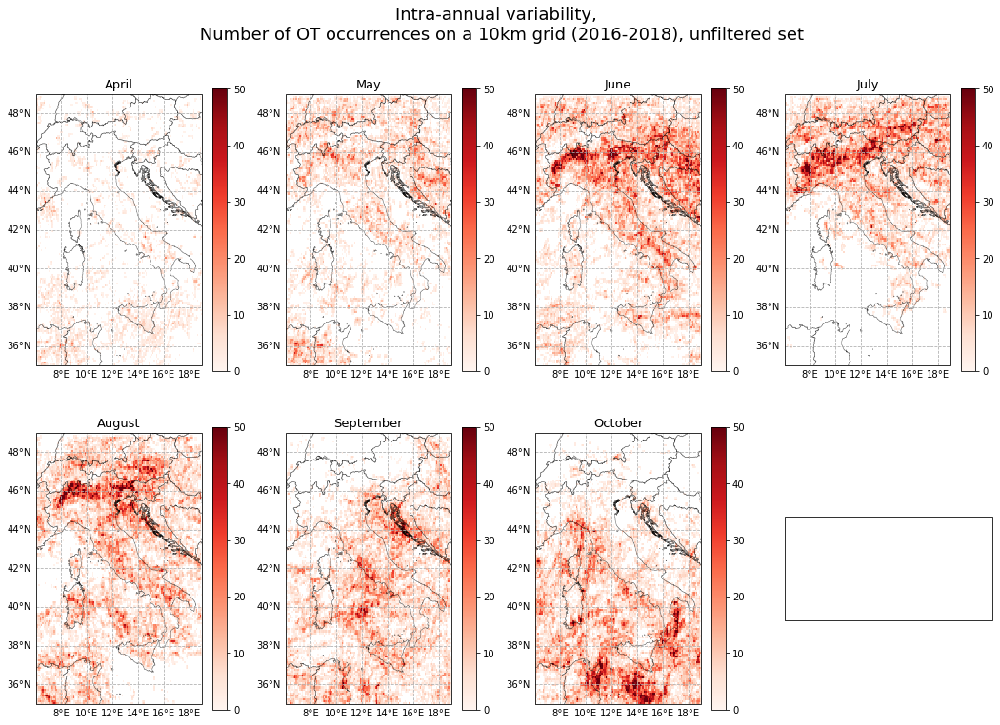

In [64]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(18,12), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid_Apr.plot(column='N_OT', ax=ax1, cmap='Reds', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('April', fontsize=13);

allOT_countOnGrid_May.plot(column='N_OT', ax=ax2, cmap='Reds', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('May', fontsize=13);

allOT_countOnGrid_Jun.plot(column='N_OT', ax=ax3, cmap='Reds', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('June', fontsize=13);

allOT_countOnGrid_Jul.plot(column='N_OT', ax=ax4, cmap='Reds', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('July', fontsize=13);

allOT_countOnGrid_Aug.plot(column='N_OT', ax=ax5, cmap='Reds', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('August', fontsize=13);

allOT_countOnGrid_Sep.plot(column='N_OT', ax=ax6, cmap='Reds', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax6, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax6.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax6.set_xlim(x_lim)
ax6.set_ylim(y_lim)
ax6.set_title('September', fontsize=13);

allOT_countOnGrid_Oct.plot(column='N_OT', ax=ax7, cmap='Reds', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax7, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax7.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax7.set_xlim(x_lim)
ax7.set_ylim(y_lim)
ax7.set_title('October', fontsize=13);

fig.suptitle('Intra-annual variability, \n Number of OT occurrences on a 10km grid (2016-2018), unfiltered set', fontsize=18);

pl.savefig(plt_fold + f"/IntraannualVar_N_OTs_10km_unfilt_2016-2018_2.pdf",dpi=100, bbox_inches='tight')

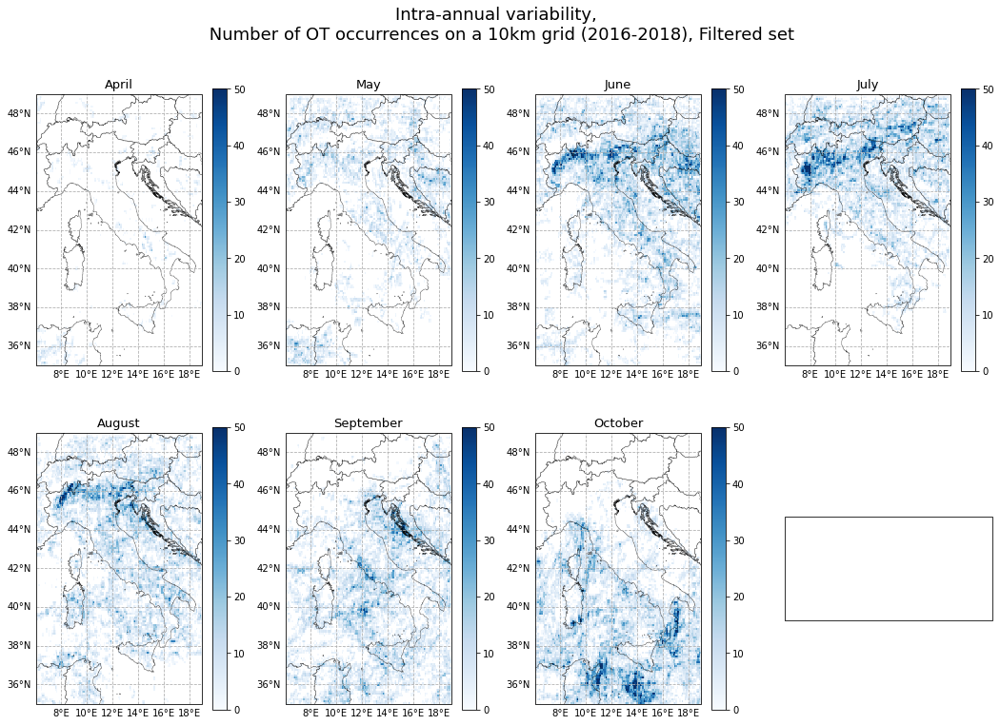

In [67]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(18,12), subplot_kw={'projection': ccrs.PlateCarree()})

filtOT_countOnGrid_Apr.plot(column='N_OT', ax=ax1, cmap='Blues', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('April', fontsize=13);

filtOT_countOnGrid_May.plot(column='N_OT', ax=ax2, cmap='Blues', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('May', fontsize=13);

filtOT_countOnGrid_Jun.plot(column='N_OT', ax=ax3, cmap='Blues', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('June', fontsize=13);

filtOT_countOnGrid_Jul.plot(column='N_OT', ax=ax4, cmap='Blues', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('July', fontsize=13);

filtOT_countOnGrid_Aug.plot(column='N_OT', ax=ax5, cmap='Blues', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('August', fontsize=13);

filtOT_countOnGrid_Sep.plot(column='N_OT', ax=ax6, cmap='Blues', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax6, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax6.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax6.set_xlim(x_lim)
ax6.set_ylim(y_lim)
ax6.set_title('September', fontsize=13);

filtOT_countOnGrid_Oct.plot(column='N_OT', ax=ax7, cmap='Blues', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax7, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax7.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax7.set_xlim(x_lim)
ax7.set_ylim(y_lim)
ax7.set_title('October', fontsize=13);

fig.suptitle('Intra-annual variability, \n Number of OT occurrences on a 10km grid (2016-2018), Filtered set', fontsize=18);

pl.savefig(plt_fold + f"/IntraannualVar_N_OTs_10km_Filt_2016-2018.pdf",dpi=100, bbox_inches='tight')

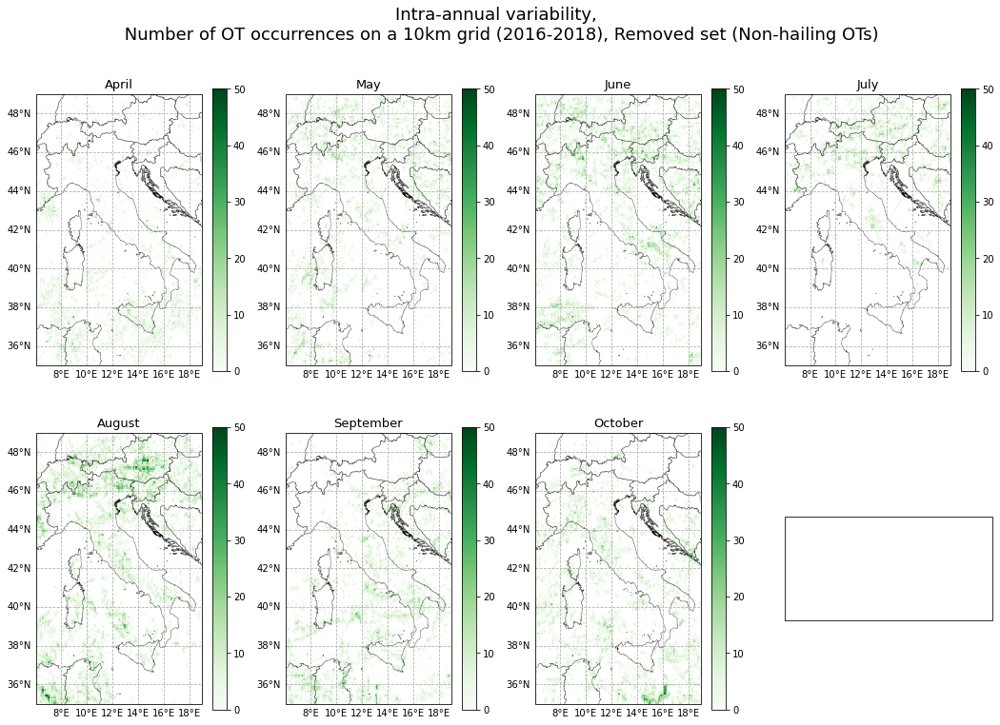

In [68]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(18,12), subplot_kw={'projection': ccrs.PlateCarree()})

remvOT_countOnGrid_Apr.plot(column='N_OT', ax=ax1, cmap='Greens', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('April', fontsize=13);

remvOT_countOnGrid_May.plot(column='N_OT', ax=ax2, cmap='Greens', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('May', fontsize=13);

remvOT_countOnGrid_Jun.plot(column='N_OT', ax=ax3, cmap='Greens', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('June', fontsize=13);

remvOT_countOnGrid_Jul.plot(column='N_OT', ax=ax4, cmap='Greens', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('July', fontsize=13);

remvOT_countOnGrid_Aug.plot(column='N_OT', ax=ax5, cmap='Greens', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('August', fontsize=13);

remvOT_countOnGrid_Sep.plot(column='N_OT', ax=ax6, cmap='Greens', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax6, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax6.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax6.set_xlim(x_lim)
ax6.set_ylim(y_lim)
ax6.set_title('September', fontsize=13);

remvOT_countOnGrid_Oct.plot(column='N_OT', ax=ax7, cmap='Greens', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax7, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax7.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax7.set_xlim(x_lim)
ax7.set_ylim(y_lim)
ax7.set_title('October', fontsize=13);

fig.suptitle('Intra-annual variability, \n Number of OT occurrences on a 10km grid (2016-2018), Removed set (Non-hailing OTs)', fontsize=18);

pl.savefig(plt_fold + f"/IntraannualVar_N_OTs_10km_Remv_2016-2018.pdf",dpi=100, bbox_inches='tight')

In [112]:
max(remvOT_countOnGrid_Apr['N_OT'][3:])

31.0

In [116]:
max(remvOT_countOnGrid_May['N_OT'][4:])

28.0

In [121]:
max(remvOT_countOnGrid_Jun['N_OT'][6:])

31.0

In [143]:
max(remvOT_countOnGrid_Aug['N_OT'])

48.0

In [146]:
max(remvOT_countOnGrid_Sep['N_OT'][3:])

34.0

In [148]:
max(remvOT_countOnGrid_Oct['N_OT'])

41.0

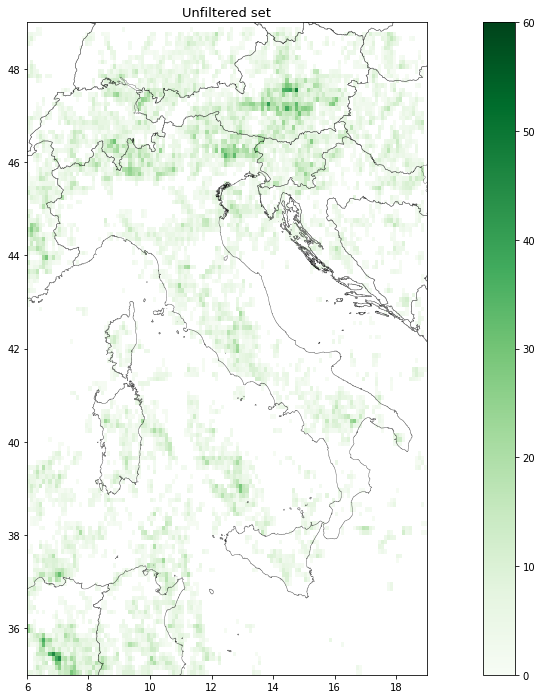

In [102]:
fig, ax1 = plt.subplots(figsize = (20,12))

remvOT_countOnGrid_Aug.plot(column='N_OT', ax=ax1, cmap='Greens', kind='geo',
                           vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Unfiltered set', fontsize=13);

## - Inter-aannual variability of spatial distributions of OTs:

In [36]:
pointInPolys_filtOT['time'] = pd.to_datetime(pointInPolys_filtOT['time'])
pointInPolys_remvOT['time'] = pd.to_datetime(pointInPolys_remvOT['time'])

In [37]:
pointInPolys_allOT_2016 = pointInPolys_allOT[pointInPolys_allOT['time'].dt.year == 2016]
pointInPolys_allOT_2017 = pointInPolys_allOT[pointInPolys_allOT['time'].dt.year == 2017]
pointInPolys_allOT_2018 = pointInPolys_allOT[pointInPolys_allOT['time'].dt.year == 2018]

pointInPolys_filtOT_2016 = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.year == 2016]
pointInPolys_filtOT_2017 = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.year == 2017]
pointInPolys_filtOT_2018 = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.year == 2018]

pointInPolys_remvOT_2016 = pointInPolys_remvOT[pointInPolys_remvOT['time'].dt.year == 2016]
pointInPolys_remvOT_2017 = pointInPolys_remvOT[pointInPolys_remvOT['time'].dt.year == 2017]
pointInPolys_remvOT_2018 = pointInPolys_remvOT[pointInPolys_remvOT['time'].dt.year == 2018]

#sum points in each grid cell
pointSumByPoly_allOT_2016 = pointInPolys_allOT_2016.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_2017 = pointInPolys_allOT_2017.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_2018 = pointInPolys_allOT_2018.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_filtOT_2016 = pointInPolys_filtOT_2016.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_2017 = pointInPolys_filtOT_2017.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_2018 = pointInPolys_filtOT_2018.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_remvOT_2016 = pointInPolys_remvOT_2016.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT_2017 = pointInPolys_remvOT_2017.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_remvOT_2018 = pointInPolys_remvOT_2018.groupby('FID')['N_OT'].agg(['sum'])


#create grid with associated number of OTs for each grid:
allOT_countOnGrid_2016 = sfg_sp.copy()
allOT_countOnGrid_2017 = sfg_sp.copy()
allOT_countOnGrid_2018 = sfg_sp.copy()

filtOT_countOnGrid_2016 = sfg_sp.copy()
filtOT_countOnGrid_2017 = sfg_sp.copy()
filtOT_countOnGrid_2018 = sfg_sp.copy()

remvOT_countOnGrid_2016 = sfg_sp.copy()
remvOT_countOnGrid_2017 = sfg_sp.copy()
remvOT_countOnGrid_2018 = sfg_sp.copy()

allOT_countOnGrid_2016['N_OT'] = pointSumByPoly_allOT_2016['sum']
allOT_countOnGrid_2017['N_OT'] = pointSumByPoly_allOT_2017['sum']
allOT_countOnGrid_2018['N_OT'] = pointSumByPoly_allOT_2018['sum']

filtOT_countOnGrid_2016['N_OT'] = pointSumByPoly_filtOT_2016['sum']
filtOT_countOnGrid_2017['N_OT'] = pointSumByPoly_filtOT_2017['sum']
filtOT_countOnGrid_2018['N_OT'] = pointSumByPoly_filtOT_2018['sum']

remvOT_countOnGrid_2016['N_OT'] = pointSumByPoly_remvOT_2016['sum']
remvOT_countOnGrid_2017['N_OT'] = pointSumByPoly_remvOT_2017['sum']
remvOT_countOnGrid_2018['N_OT'] = pointSumByPoly_remvOT_2018['sum']

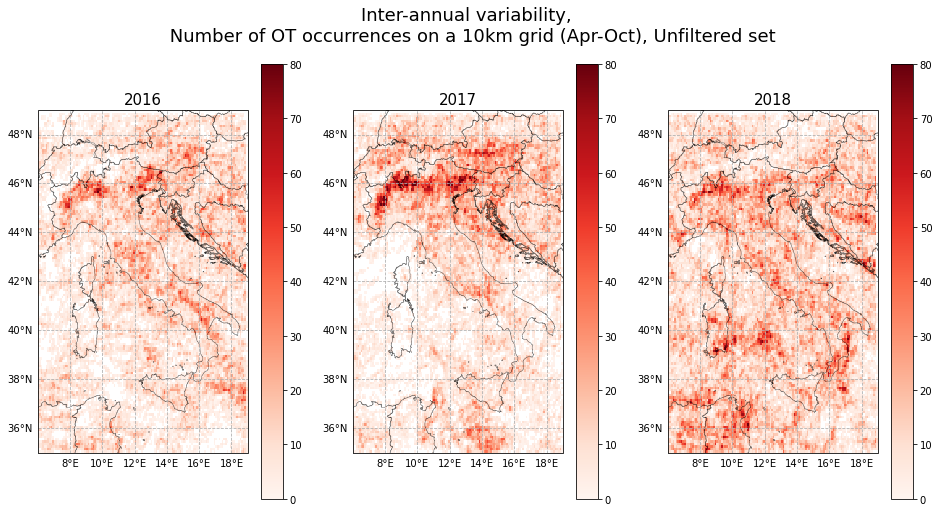

In [71]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid_2016.plot(column='N_OT', ax=ax1, cmap='Reds', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('2016', fontsize=15);

allOT_countOnGrid_2017.plot(column='N_OT', ax=ax2, cmap='Reds', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('2017', fontsize=15);

allOT_countOnGrid_2018.plot(column='N_OT', ax=ax3, cmap='Reds', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('2018', fontsize=15);

fig.suptitle('Inter-annual variability, \n Number of OT occurrences on a 10km grid (Apr-Oct), Unfiltered set', fontsize=18);

pl.savefig(plt_fold + f"/Inter-annualVar_N_OTs_10km_Unfilt_2016-2018.png",dpi=100, bbox_inches='tight')

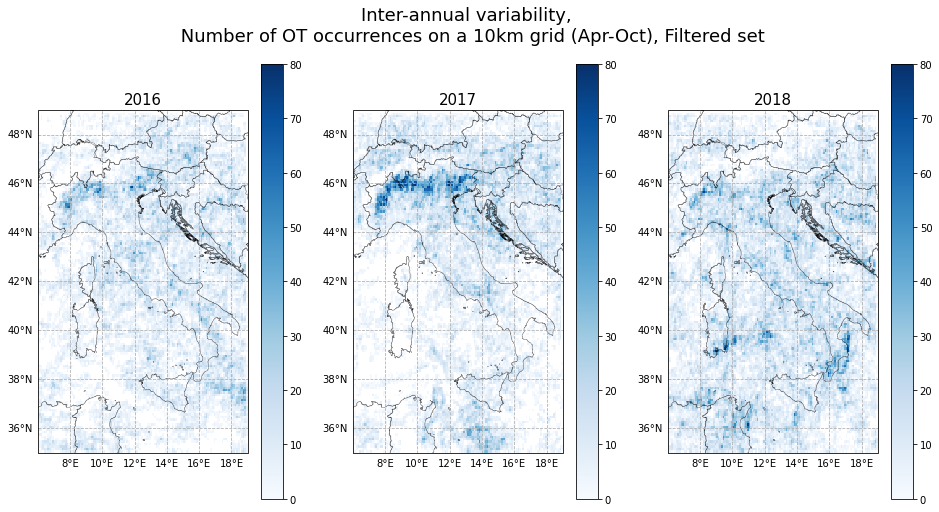

In [72]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8), subplot_kw={'projection': ccrs.PlateCarree()})

filtOT_countOnGrid_2016.plot(column='N_OT', ax=ax1, cmap='Blues', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('2016', fontsize=15);

filtOT_countOnGrid_2017.plot(column='N_OT', ax=ax2, cmap='Blues', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('2017', fontsize=15);

filtOT_countOnGrid_2018.plot(column='N_OT', ax=ax3, cmap='Blues', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('2018', fontsize=15);

fig.suptitle('Inter-annual variability, \n Number of OT occurrences on a 10km grid (Apr-Oct), Filtered set', fontsize=18);

pl.savefig(plt_fold + f"/Inter-annualVar_N_OTs_10km_Filt_2016-2018.png",dpi=100, bbox_inches='tight')

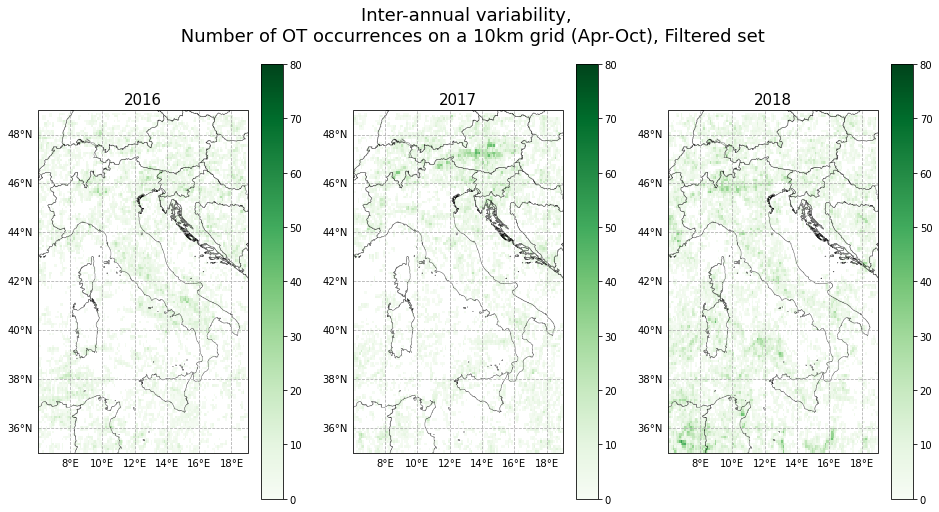

In [73]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8), subplot_kw={'projection': ccrs.PlateCarree()})

remvOT_countOnGrid_2016.plot(column='N_OT', ax=ax1, cmap='Greens', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('2016', fontsize=15);

remvOT_countOnGrid_2017.plot(column='N_OT', ax=ax2, cmap='Greens', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('2017', fontsize=15);

remvOT_countOnGrid_2018.plot(column='N_OT', ax=ax3, cmap='Greens', kind='geo', vmin=0, vmax=80, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('2018', fontsize=15);

fig.suptitle('Inter-annual variability, \n Number of OT occurrences on a 10km grid (Apr-Oct), Filtered set', fontsize=18);

pl.savefig(plt_fold + f"/Inter-annualVar_N_OTs_10km_Remv_2016-2018.png",dpi=100, bbox_inches='tight')